In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import cv2
from IPython.display import clear_output
from scipy.spatial import distance
import numpy as np
import os
from time import perf_counter
from matplotlib import pyplot
from PIL import Image
from numpy import asarray
import time
from timeit import default_timer as timer
import math
from mtcnn.mtcnn import MTCNN
from random import choice
from numpy import load
from numpy import expand_dims
from numpy import asarray
from numpy import savez_compressed
from os import listdir
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import Normalizer
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from sklearn.svm import SVC
from matplotlib import pyplot
from matplotlib import pyplot as plt

from keras.models import load_model
from faced import FaceDetector
from faced.utils import annotate_image


# Global variables and definitions
face_detector = FaceDetector()
model_path = '/home/knnan/Development/face_recognition/Facenet/keras-facenet/model/facenet_keras.h5'
model = load_model(model_path)
face_embeddings_file = '/home/knnan/Development/face_recognition/Facenet/all_faces_embeddings.npz'
pre_embeddings_data = load(face_embeddings_file)
print("Model has Loaded")




def euc(a,b):
    dst = distance.euclidean(a, b)
    return dst

def display_multi_images(images_array):
    f = pyplot.figure(figsize=(20, 20))
    columns = 3
    rows = 1
    image_index = 0
    for i in range(1, columns*rows +1):
        
        if(image_index+1 > len(images_array)):
            break
        f.add_subplot(rows, columns, i)
        pyplot.imshow(images_array[image_index])
        image_index += 1
     
    pyplot.show()
    
def get_multi_embeddings(model, face_pixels_array):
    embeddings_array = []
    in_encoder = Normalizer(norm='l2')
    for face_pixels in face_pixels_array:
        face_pixels = face_pixels.astype('float32')
        # standardize pixel values across channels (global)
        mean, std = face_pixels.mean(), face_pixels.std()
        face_pixels = (face_pixels - mean) / std
        # transform face into one sample
        samples = expand_dims(face_pixels, axis=0)
        # make prediction to get embedding
        yhat = model.predict(samples)
        # return back face embedding
        embeddings_array.append(yhat[0])
        
    print('No of embeddings : ',len(embeddings_array))
    return in_encoder.transform(embeddings_array)



def calVecdist(listvec,emb):
    meanlist = []
    for i in listvec:
        print(euc(i,emb))
        meanlist.append(euc(i,emb))
    print('Average distance is ',np.mean(meanlist))
    return [min(meanlist),np.mean(meanlist)]
    
def getFaces(frame='/home/knnan/Development/face_recognition/unknown_faces/multiple_faces/ab_ha.png',type='image'):
    cropped_faces = []
    cordinates = []
    multi_face_image = '/home/knnan/Development/face_recognition/unknown_faces/multiple_faces/ab_ha.png'
    required_size = (160, 160)
    original_image = frame
    if(type == 'image'):
        original_image = cv2.imread(frame)
    rgb_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    pixels = rgb_image
    bboxes = face_detector.predict(pixels)
    print("No of Faces Detected : ",len(bboxes))
    

    ann_image = annotate_image(original_image.copy(), bboxes)
    for bbox  in bboxes:
        x, y, width, height,p = bbox
        print('probability : ',p)
        if p < 0.70:
            continue

        x1 = int(x - width/2)
        y1 = int(y - height/2)
        x2 = int(x + width/2)
        y2 = int(y + height/2)
        cordinates.append((x1,y1,x2,y2))

        face = pixels[y1:y2, x1:x2]
        # resize pixels to the model size
        image = Image.fromarray(face)
        image = image.resize(required_size)
        single_face_array = asarray(image)
        cropped_faces.append(single_face_array)
    print('No of cropped_faces : ',len(cropped_faces))
#     display_multi_images(cropped_faces)
    return [cropped_faces,cordinates,original_image]


Using TensorFlow backend.







Model has Loaded


/usr/local/lib/python3.7/dist-packages/keras/engine/saving.py:341: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [2]:
%matplotlib inline
def update_plot(prediction,embedding):
  
#     ax.clear()
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111, projection='3d')
    X_unown = []
    X_unown.append(embedding)
    
    Xd_unown = pca.transform(X_unown)
    
    ax.plot(Xd_Hameem[:,0], Xd_Hameem[:,1], Xd_Hameem[:,2],
            'o', markersize=8, color='blue', alpha=0.5, label='Hameem')
    ax.plot(Xd_Abdullah[:,0], Xd_Abdullah[:,1], Xd_Abdullah[:,2],
            'o', markersize=8, color='red', alpha=0.5, label='Abdullah')
    ax.plot(Xd_Munirul[:,0], Xd_Munirul[:,1], Xd_Munirul[:,2],
            'o', markersize=8, color='green', alpha=0.5, label='Munirul')
    ax.plot(Xd_Nishad[:,0], Xd_Nishad[:,1], Xd_Nishad[:,2],
            'o', markersize=8, color='yellow', alpha=0.5, label='Nishad')
    ax.plot(Xd_unown[:,0], Xd_unown[:,1], Xd_unown[:,2],
            'o', markersize=8, color='black', alpha=0.5, label='unown')
    ax.legend(loc='upper right')
    print('dude its happing for',prediction,Xd_unown)
    ax.view_init(190, 40)
    plt.title('Embedding Vector')
    ax.legend(loc='upper right')

    plt.show()
#     fig.canvas.draw_idle()

    
    
def calman(prediction,embedding):
    minv = None
    X_unown = []
    X_unown.append(embedding)
    Xd_unown = pca.transform(X_unown)
    if prediction == 'Hameem':
        minv = calVecdist(Xd_Hameem,Xd_unown)
    elif prediction == 'munirul':
        minv = calVecdist(Xd_Munirul,Xd_unown)
    elif prediction == 'Abdullah':
        minv = calVecdist(Xd_Abdullah,Xd_unown)
    elif prediction == 'Nishad':
        minv = calVecdist(Xd_Nishad,Xd_unown)
    elif prediction == 'toufiq':
        minv = calVecdist(Xd_toufiq,Xd_unown)
    return minv
print('finished cell 3')

finished cell 3


Dataset: train=19, test=16


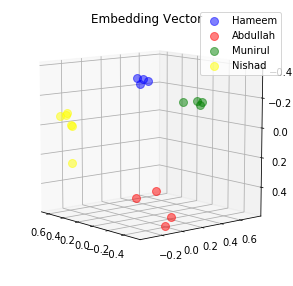

In [3]:
%matplotlib inline
face_embeddings_file = '/home/knnan/Development/face_recognition/Facenet/all_faces_embeddings.npz'
    
data = load(face_embeddings_file)
face_detector = FaceDetector()
trainX, trainy, testX, testy = data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3']
print('Dataset: train=%d, test=%d' % (trainX.shape[0], testX.shape[0]))
# normalize input vectors
in_encoder = Normalizer(norm='l2')
trainX = in_encoder.transform(trainX)
testX = in_encoder.transform(testX)






pca = PCA(n_components=3).fit(trainX)

X_Hameem = []
X_Munirul = []
X_Abdullah = []
X_Nishad = []
X_toufiq = []

for emb,name in zip(trainX,trainy):
    if name == 'Hameem':
        X_Hameem.append(emb)
    elif name == 'munirul':
        X_Munirul.append(emb)
    elif name == 'Abdullah':
        X_Abdullah.append(emb)
    elif name == 'Nishad':
        X_Nishad.append(emb)
    elif name == 'toufiq':
        X_toufiq.append(emb)

Xd_Hameem = pca.transform(X_Hameem)
Xd_Abdullah = pca.transform(X_Abdullah)
Xd_Munirul = pca.transform(X_Munirul)
Xd_Nishad = pca.transform(X_Nishad)
Xd_toufiq = pca.transform(X_toufiq)
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111, projection='3d')
plt.rcParams['legend.fontsize'] = 10   
ax.plot(Xd_Hameem[:,0], Xd_Hameem[:,1], Xd_Hameem[:,2],
        'o', markersize=8, color='blue', alpha=0.5, label='Hameem')
ax.plot(Xd_Abdullah[:,0], Xd_Abdullah[:,1], Xd_Abdullah[:,2],
        'o', markersize=8, color='red', alpha=0.5, label='Abdullah')
ax.plot(Xd_Munirul[:,0], Xd_Munirul[:,1], Xd_Munirul[:,2],
        'o', markersize=8, color='green', alpha=0.5, label='Munirul')
ax.plot(Xd_Nishad[:,0], Xd_Nishad[:,1], Xd_Nishad[:,2],
        'o', markersize=8, color='yellow', alpha=0.5, label='Nishad')
ax.view_init(190, 40)
plt.title('Embedding Vector')
ax.legend(loc='upper right')

plt.show()








# label encode targets
out_encoder = LabelEncoder()
out_encoder.fit(trainy)
trainy = out_encoder.transform(trainy)
testy = out_encoder.transform(testy)
svcmodel = SVC(kernel='linear', probability=True)
svcmodel.fit(trainX, trainy)
# predict
yhat_train = svcmodel.predict(trainX)
yhat_test = svcmodel.predict(testX)
# score
score_train = accuracy_score(trainy, yhat_train)
score_test = accuracy_score(testy, yhat_test)



No of Faces Detected :  1
probability :  0.99669117
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.43644997 -0.17071632 -0.33835647]]


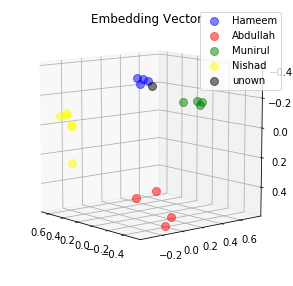

0.11313705146312714
0.14930985867977142
0.15267744660377502
0.17782212793827057
Average distance is  0.14823662117123604
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.33302409203947
No of Faces Detected :  1
probability :  0.9970876
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.45930943 -0.17876667 -0.32073307]]


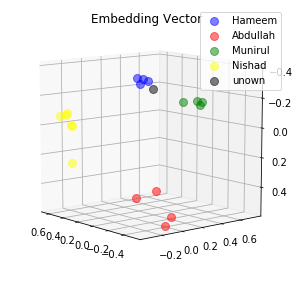

0.10529111325740814
0.14112575352191925
0.1467886120080948
0.17610210180282593
Average distance is  0.14232689514756203
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.50442612053937
No of Faces Detected :  1
probability :  0.997693
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49998975 -0.18440723 -0.28055227]]


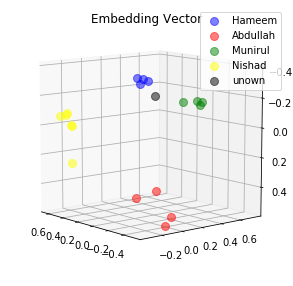

0.12392203509807587
0.15382149815559387
0.16353526711463928
0.19744352996349335
Average distance is  0.1596805825829506
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.264805361887525
No of Faces Detected :  1
probability :  0.99809605
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.45736915 -0.22608016 -0.26530555]]


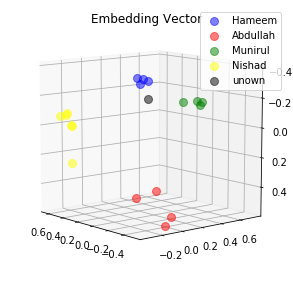

0.12559500336647034
0.13246549665927887
0.15555720031261444
0.17531874775886536
Average distance is  0.14723411202430725
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.21310804322747
No of Faces Detected :  1
probability :  0.9984751
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.46950874 -0.24346891 -0.27974486]]


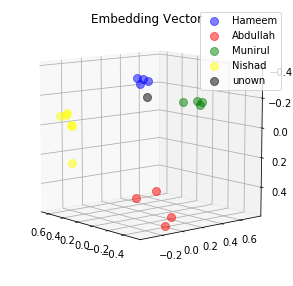

0.10527527332305908
0.10891706496477127
0.13264261186122894
0.15344193577766418
Average distance is  0.12506922148168087
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.72841951871673
No of Faces Detected :  1
probability :  0.9983316
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4564523  -0.23713045 -0.24019453]]


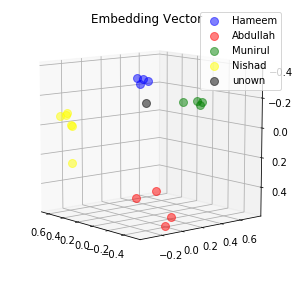

0.1473376601934433
0.1463359147310257
0.1733984500169754
0.18979841470718384
Average distance is  0.16421760991215706
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.7495433837972
No of Faces Detected :  1
probability :  0.99806726
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47476804 -0.19633843 -0.2940114 ]]


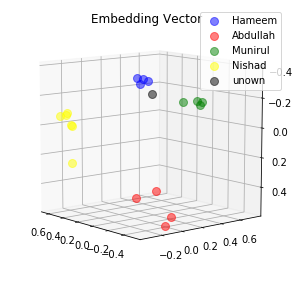

0.10803218185901642
0.1350606232881546
0.14695747196674347
0.17644360661506653
Average distance is  0.14162347093224525
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.26031743047685
No of Faces Detected :  1
probability :  0.9982085
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49199852 -0.21820542 -0.2535189 ]]


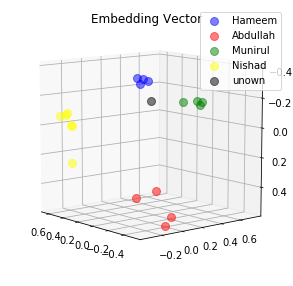

0.13313086330890656
0.14550726115703583
0.16500338912010193
0.19181665778160095
Average distance is  0.15886454284191132
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.03639221683667
No of Faces Detected :  1
probability :  0.99822205
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48498988 -0.22572792 -0.26810813]]


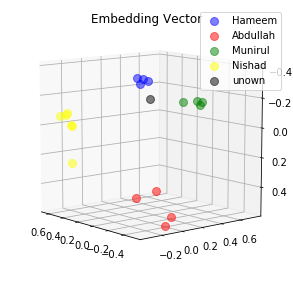

0.11745870113372803
0.12908947467803955
0.14892610907554626
0.1748557984828949
Average distance is  0.14258252084255219
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.132023894172065
No of Faces Detected :  1
probability :  0.99822724
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49287927 -0.21374696 -0.27498296]]


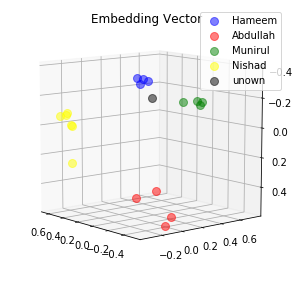

0.11438632011413574
0.13326595723628998
0.14909949898719788
0.17872898280620575
Average distance is  0.14387018978595734
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.09709577422466
No of Faces Detected :  1
probability :  0.99815714
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4676988  -0.21864109 -0.29147616]]


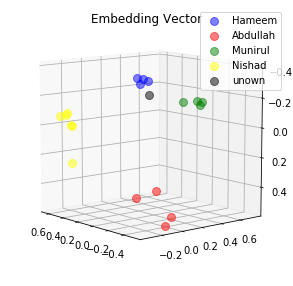

0.10122883319854736
0.11856406927108765
0.13568627834320068
0.16091980040073395
Average distance is  0.1290997453033924
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.631242343305175
No of Faces Detected :  1
probability :  0.99820304
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47630817 -0.22297038 -0.297277  ]]


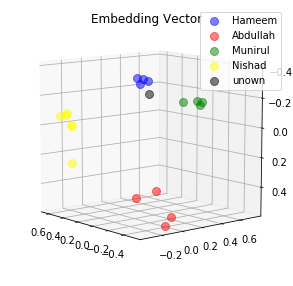

0.09230492264032364
0.11113522201776505
0.12703482806682587
0.15436463057994843
Average distance is  0.12120990082621574
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.85572316378487
No of Faces Detected :  1
probability :  0.9980799
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48636803 -0.21208379 -0.30193642]]


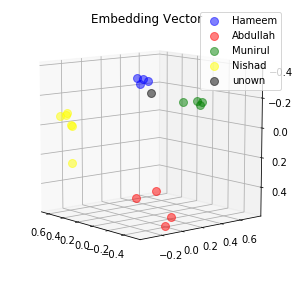

0.09130571037530899
0.11772317439317703
0.12924668192863464
0.16063924133777618
Average distance is  0.12472870200872421
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.94631907620435
No of Faces Detected :  1
probability :  0.9981406
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48282447 -0.21580507 -0.29885188]]


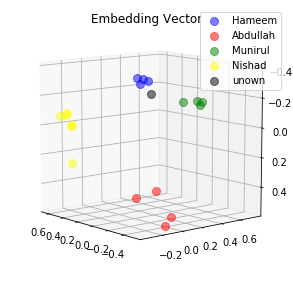

0.09268217533826828
0.11610715091228485
0.12942859530448914
0.15930896997451782
Average distance is  0.12438172288239002
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.27086931178126
No of Faces Detected :  1
probability :  0.9978895
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.50863045 -0.2031945  -0.27501887]]


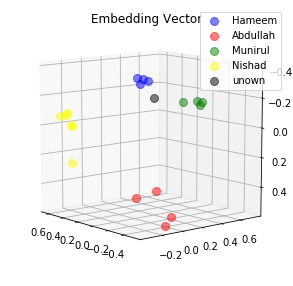

0.1194193884730339
0.14365507662296295
0.1558564305305481
0.18927322328090668
Average distance is  0.1520510297268629
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.768173094386704
No of Faces Detected :  1
probability :  0.99792963
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48042715 -0.20690002 -0.31174305]]


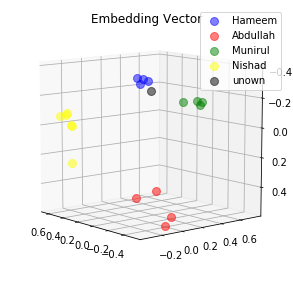

0.08677022159099579
0.11718908697366714
0.1264466494321823
0.157968670129776
Average distance is  0.12209365703165531
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.98120227953458
No of Faces Detected :  1
probability :  0.99782634
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.50585276 -0.21721338 -0.2689628 ]]


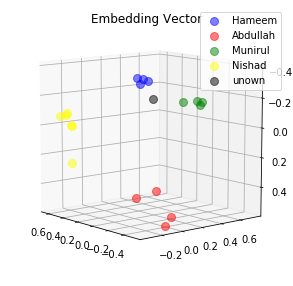

0.11915179342031479
0.1369243562221527
0.15255141258239746
0.18351159989833832
Average distance is  0.14803479053080082
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.98260684688547
No of Faces Detected :  1
probability :  0.9973917
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49572626 -0.1980775  -0.30747038]]


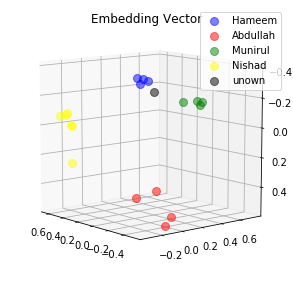

0.09415919333696365
0.12815417349338531
0.13495071232318878
0.16996747255325317
Average distance is  0.13180788792669773
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.25744827128761
No of Faces Detected :  1
probability :  0.9970252
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.52488637 -0.2060399  -0.27021176]]


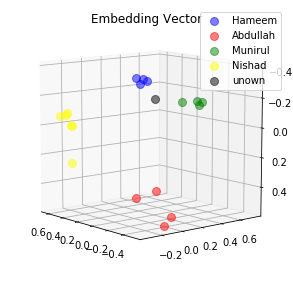

0.12523040175437927
0.14884990453720093
0.16016995906829834
0.19527271389961243
Average distance is  0.15738074481487274
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.057745656568684
No of Faces Detected :  1
probability :  0.9968061
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49834365 -0.22239684 -0.2843987 ]]


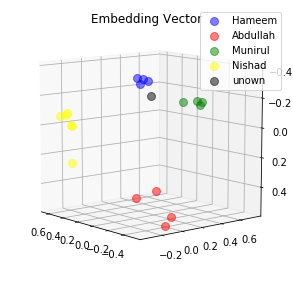

0.1024794653058052
0.1213984340429306
0.136459082365036
0.16726864874362946
Average distance is  0.13190140761435032
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.347774814167835
No of Faces Detected :  1
probability :  0.9962516
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5184532  -0.20222744 -0.2698697 ]]


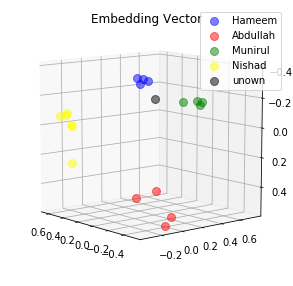

0.12581828236579895
0.14994505047798157
0.16162531077861786
0.1960706263780594
Average distance is  0.15836481750011444
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.95114935877304
No of Faces Detected :  1
probability :  0.9937711
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5065567  -0.21371499 -0.2773916 ]]


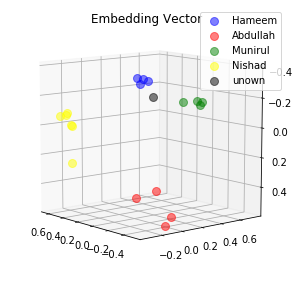

0.11265131086111069
0.13388869166374207
0.14754647016525269
0.17994868755340576
Average distance is  0.1435087900608778
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.49433671070941
No of Faces Detected :  1
probability :  0.9927306
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48454309 -0.22085837 -0.30493727]]


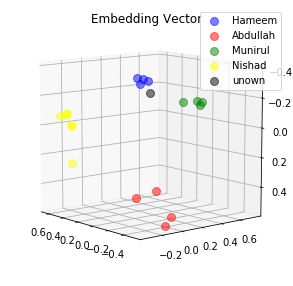

0.08482756465673447
0.10861620306968689
0.12139301002025604
0.15182338654994965
Average distance is  0.11666504107415676
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.49046205921262
No of Faces Detected :  1
probability :  0.99029285
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.51392925 -0.19305196 -0.30498314]]


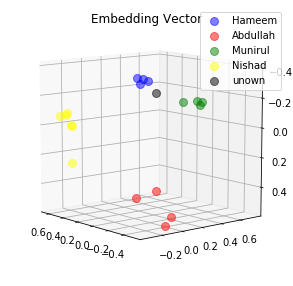

0.10091911256313324
0.13726714253425598
0.14158105850219727
0.17982728779315948
Average distance is  0.1398986503481865
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.98328297871279
No of Faces Detected :  1
probability :  0.98623824
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.52393085 -0.2177594  -0.30431196]]


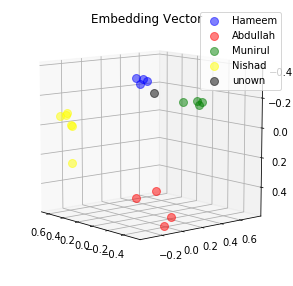

0.09049860388040543
0.1203431636095047
0.12665633857250214
0.16504807770252228
Average distance is  0.12563654594123363
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.79809382197844
No of Faces Detected :  1
probability :  0.98595846
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.516682   -0.21790646 -0.3236416 ]]


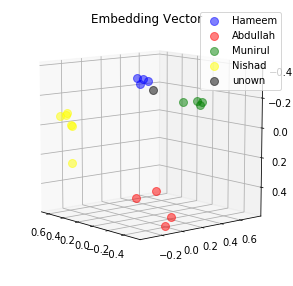

0.07239922881126404
0.10911102592945099
0.11145555227994919
0.1513654887676239
Average distance is  0.11108282394707203
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.03920566174296
No of Faces Detected :  1
probability :  0.98660314
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.509365   -0.20570546 -0.31438297]]


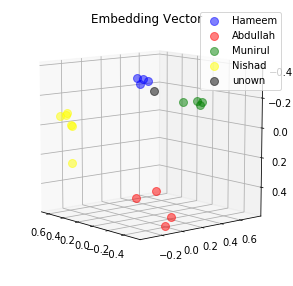

0.08509208261966705
0.1211269348859787
0.1254393607378006
0.16342709958553314
Average distance is  0.12377136945724487
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.97596511520315
No of Faces Detected :  1
probability :  0.9864431
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5184053  -0.19823183 -0.30041936]]


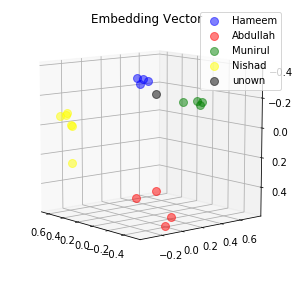

0.10218443721532822
0.13616155087947845
0.1415361762046814
0.17973443865776062
Average distance is  0.13990415073931217
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.97262829974123
No of Faces Detected :  1
probability :  0.9859191
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.51654726 -0.19606061 -0.29694074]]


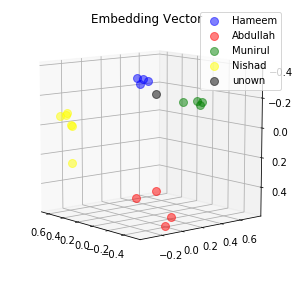

0.10579656064510345
0.13909634947776794
0.14518560469150543
0.18280993402004242
Average distance is  0.1432221122086048
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.33149580966633
No of Faces Detected :  1
probability :  0.9838453
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.51276606 -0.19883774 -0.31194752]]


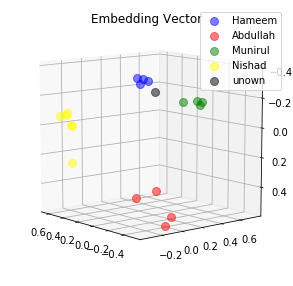

0.09180494397878647
0.12901711463928223
0.13256989419460297
0.17116492986679077
Average distance is  0.1311392206698656
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.226346336166266
No of Faces Detected :  1
probability :  0.98381066
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.50102186 -0.18890795 -0.30445388]]


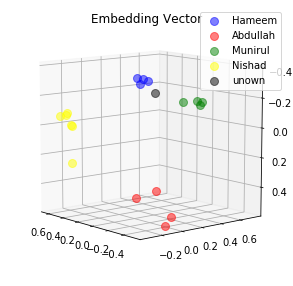

0.10253152996301651
0.138398215174675
0.14395152032375336
0.18013331294059753
Average distance is  0.1412536446005106
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.50419215646623
No of Faces Detected :  1
probability :  0.98263216
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49445102 -0.20090973 -0.29638624]]


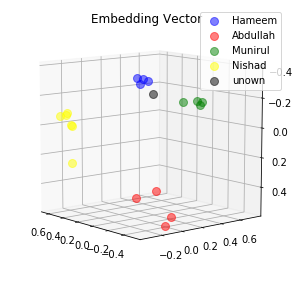

0.10143142938613892
0.1308658868074417
0.14061784744262695
0.17401699721813202
Average distance is  0.1367330402135849
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.635757712136396
No of Faces Detected :  1
probability :  0.9823381
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.50790423 -0.21088514 -0.2955407 ]]


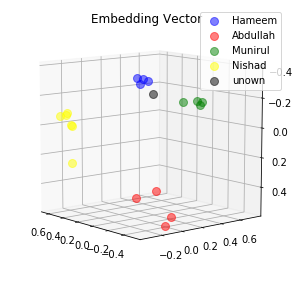

0.09773819893598557
0.12547817826271057
0.13510887324810028
0.17018349468708038
Average distance is  0.1321271862834692
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.79871566746833
No of Faces Detected :  1
probability :  0.98215294
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49300206 -0.21000907 -0.32337877]]


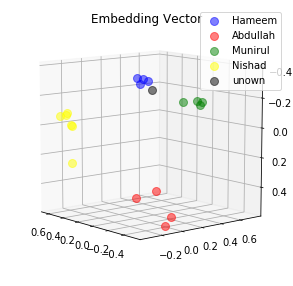

0.07434210926294327
0.11052630096673965
0.11553257703781128
0.15103231370449066
Average distance is  0.11285832524299622
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.71587010577928
No of Faces Detected :  1
probability :  0.9817668
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5057422  -0.20870735 -0.3093923 ]]


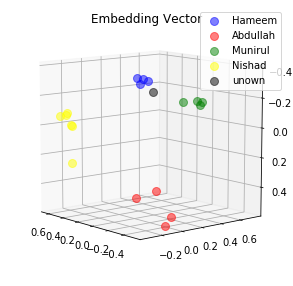

0.08684910088777542
0.11981324106454849
0.12631165981292725
0.16285715997219086
Average distance is  0.1239577904343605
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.64390681906287
No of Faces Detected :  1
probability :  0.981372
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4883763  -0.20851904 -0.29515046]]


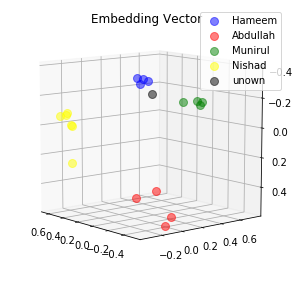

0.09875717759132385
0.12453407794237137
0.13655099272727966
0.1679639369249344
Average distance is  0.13195154629647732
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.65266905349563
No of Faces Detected :  1
probability :  0.9800106
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5079457  -0.19923458 -0.2949536 ]]


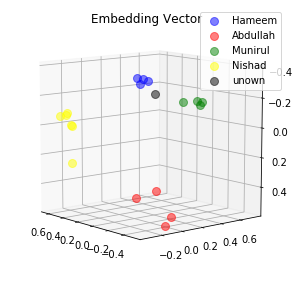

0.10425487905740738
0.13532322645187378
0.1433616578578949
0.17918390035629272
Average distance is  0.1405309159308672
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.92405216920586
No of Faces Detected :  1
probability :  0.98047
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5076188  -0.20240021 -0.26826397]]


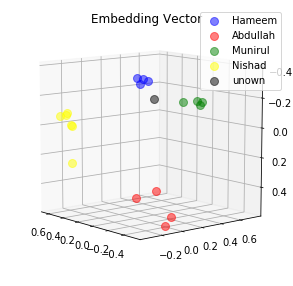

0.1256844401359558
0.1483239233493805
0.16161559522151947
0.19420398771762848
Average distance is  0.15745698660612106
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.59315671898015
No of Faces Detected :  1
probability :  0.98030996
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49428415 -0.20296371 -0.29178673]]


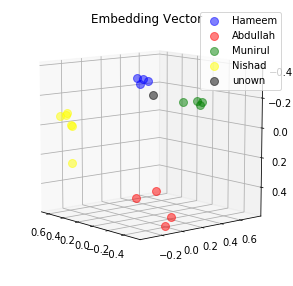

0.10420677810907364
0.13158546388149261
0.14258213341236115
0.17529825866222382
Average distance is  0.1384181585162878
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.80352056962369
No of Faces Detected :  1
probability :  0.9805105
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48871142 -0.21819814 -0.2804962 ]]


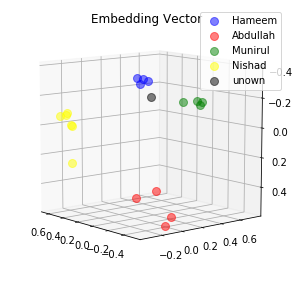

0.10781040042638779
0.12590031325817108
0.14216959476470947
0.17106930911540985
Average distance is  0.13673740439116955
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.13489326920547
No of Faces Detected :  1
probability :  0.9804666
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4929729  -0.22522913 -0.29363343]]


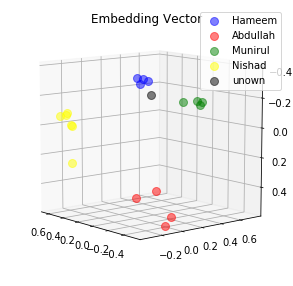

0.09284473210573196
0.11254122108221054
0.12723533809185028
0.15773504972457886
Average distance is  0.12258908525109291
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.04294331045488
No of Faces Detected :  1
probability :  0.9819002
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49135938 -0.2267356  -0.28517285]]


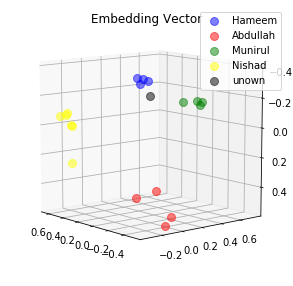

0.10041709989309311
0.11674105376005173
0.13346223533153534
0.16241562366485596
Average distance is  0.12825900316238403
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.71588223733499
No of Faces Detected :  1
probability :  0.98112845
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.50220734 -0.22479492 -0.28603885]]


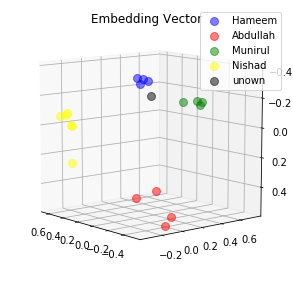

0.10030967742204666
0.11927016824483871
0.13390687108039856
0.16540580987930298
Average distance is  0.12972313165664673
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.13804491432299
No of Faces Detected :  1
probability :  0.97853106
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.50049543 -0.21668097 -0.26446506]]


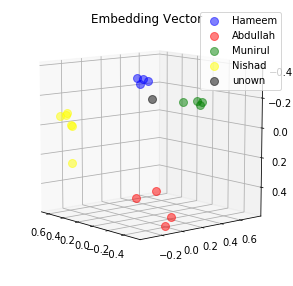

0.12323513627052307
0.13950006663799286
0.15637406706809998
0.1859663873910904
Average distance is  0.15126891434192657
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.22452518990321
No of Faces Detected :  1
probability :  0.977401
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49111903 -0.22493228 -0.26263198]]


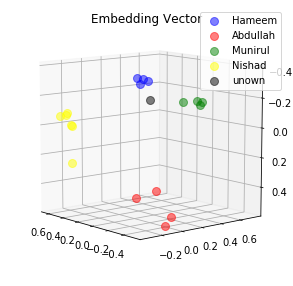

0.12253966182470322
0.13417404890060425
0.15379971265792847
0.18049919605255127
Average distance is  0.1477531548589468
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.83878372737992
No of Faces Detected :  1
probability :  0.9734796
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49879313 -0.22501191 -0.25639018]]


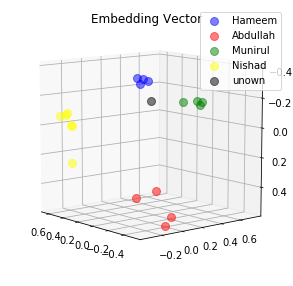

0.12849651277065277
0.13982275128364563
0.15925012528896332
0.18672405183315277
Average distance is  0.15357336029410362
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.754468139723286
No of Faces Detected :  1
probability :  0.97095525
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.50223917 -0.20595874 -0.27491784]]


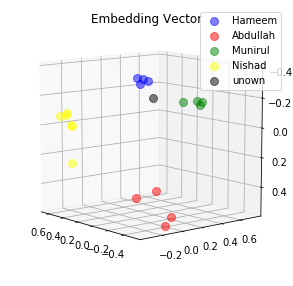

0.1177639439702034
0.1404162496328354
0.1538446843624115
0.18593792617321014
Average distance is  0.1494907010346651
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.481196451050415
No of Faces Detected :  1
probability :  0.9699247
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49210417 -0.20941098 -0.29083058]]


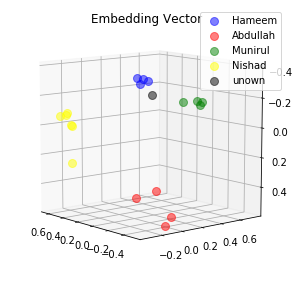

0.10190043598413467
0.12660683691501617
0.13911274075508118
0.17074067890644073
Average distance is  0.1345901731401682
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.847442449475935
No of Faces Detected :  1
probability :  0.97008735
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4978802  -0.19747317 -0.28793105]]


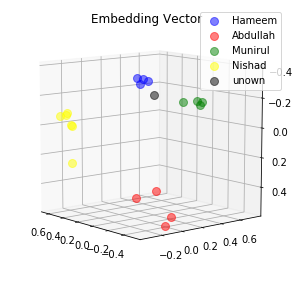

0.11039786040782928
0.13870584964752197
0.14914748072624207
0.18254788219928741
Average distance is  0.14519976824522018
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.5339919546861
No of Faces Detected :  1
probability :  0.9686888
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4674558  -0.19570217 -0.28703934]]


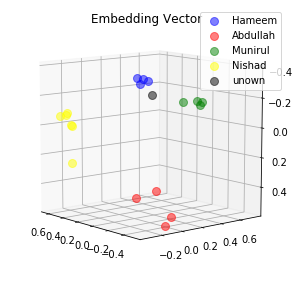

0.11562046408653259
0.13972102105617523
0.15354226529598236
0.18094132840633392
Average distance is  0.14745626971125603
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.59672183904216
No of Faces Detected :  1
probability :  0.9690963
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.46091977 -0.19404626 -0.28727058]]


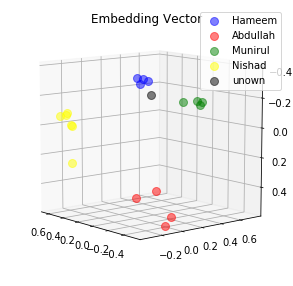

0.11808691173791885
0.1416279673576355
0.15580397844314575
0.18197588622570038
Average distance is  0.14937368594110012
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.58569450489382
No of Faces Detected :  1
probability :  0.9692351
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48871055 -0.2063228  -0.27806368]]


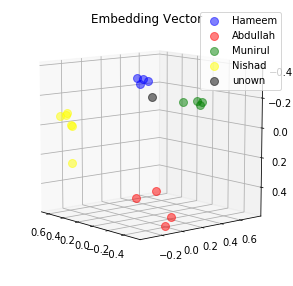

0.11482208967208862
0.1364738494157791
0.15111549198627472
0.1810196042060852
Average distance is  0.14585775882005692
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.88207987903126
No of Faces Detected :  1
probability :  0.96667325
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48324725 -0.22463828 -0.26235723]]


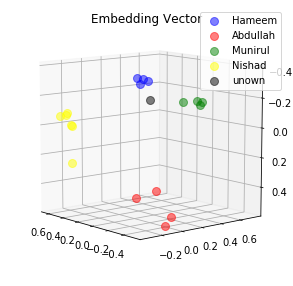

0.1234331876039505
0.13405533134937286
0.15459893643856049
0.17977721989154816
Average distance is  0.147966168820858
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.049801641223794
No of Faces Detected :  1
probability :  0.9621943
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47947934 -0.2162329  -0.2934549 ]]


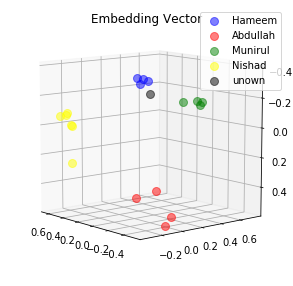

0.09780573099851608
0.11880607903003693
0.13368521630764008
0.16217847168445587
Average distance is  0.12811887450516224
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.71775325998559
No of Faces Detected :  1
probability :  0.9543081
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.46811303 -0.20197535 -0.29462475]]


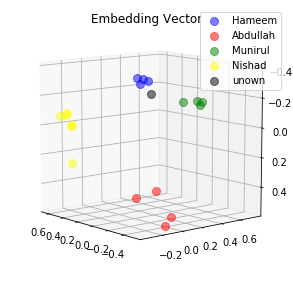

0.1059945747256279
0.13030481338500977
0.14376528561115265
0.1713007092475891
Average distance is  0.13784134574234486
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.96144558456856
No of Faces Detected :  1
probability :  0.9535513
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47431222 -0.20698178 -0.30112442]]


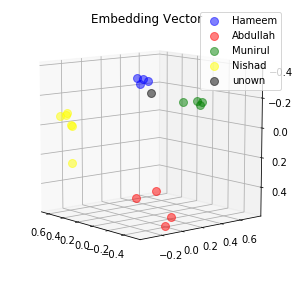

0.09656434506177902
0.12229123711585999
0.13465078175067902
0.16368789970874786
Average distance is  0.12929856590926647
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.626946232956406
No of Faces Detected :  1
probability :  0.9476743
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.50246    -0.20476168 -0.2838696 ]]


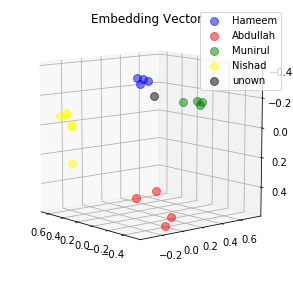

0.11036594957113266
0.1358804553747177
0.1475711613893509
0.18079088628292084
Average distance is  0.14365211315453053
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.39378050395423
No of Faces Detected :  1
probability :  0.944131
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48427784 -0.20545971 -0.29455703]]


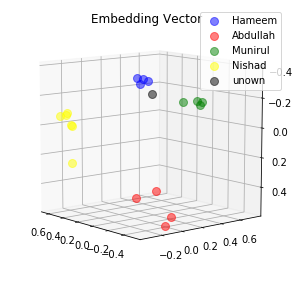

0.10119210183620453
0.12714676558971405
0.139291450381279
0.17005230486392975
Average distance is  0.13442065566778183
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.50586597600834
No of Faces Detected :  1
probability :  0.93898493
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49730876 -0.19760147 -0.30230036]]


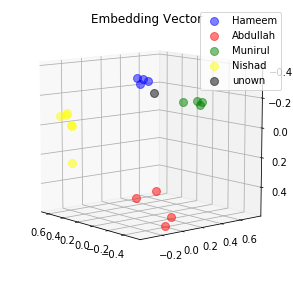

0.09853531420230865
0.13115884363651276
0.13881716132164001
0.17362220585346222
Average distance is  0.1355333812534809
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.77892151016047
No of Faces Detected :  1
probability :  0.94005454
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.484251   -0.19915403 -0.30148974]]


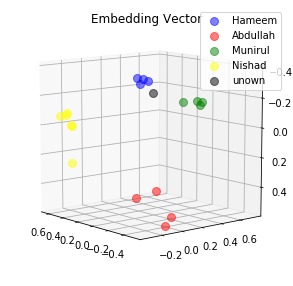

0.09892240911722183
0.12894827127456665
0.13868831098079681
0.170662984251976
Average distance is  0.13430549390614033
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.65262650278194
No of Faces Detected :  1
probability :  0.94201446
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47274598 -0.21051157 -0.2965678 ]]


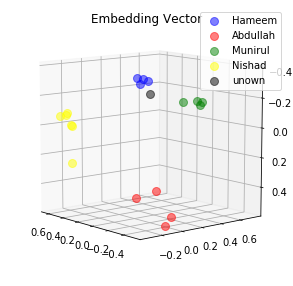

0.0989890918135643
0.12181657552719116
0.13588982820510864
0.16376622021198273
Average distance is  0.1301154289394617
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.772830371443554
No of Faces Detected :  1
probability :  0.94214994
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5050949  -0.19713603 -0.28758374]]


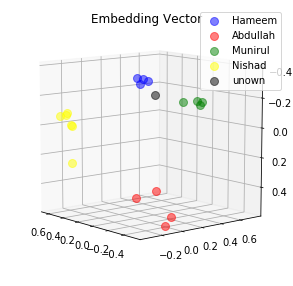

0.11124148219823837
0.14036795496940613
0.14992597699165344
0.18458324670791626
Average distance is  0.14652966521680355
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.182979838417566
No of Faces Detected :  1
probability :  0.94341826
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.44938585 -0.22562708 -0.3168998 ]]


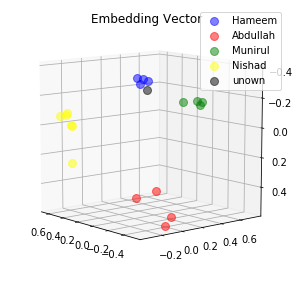

0.08502320945262909
0.10237664729356766
0.11807289719581604
0.13932713866233826
Average distance is  0.11119997315108776
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.93275633101584
No of Faces Detected :  1
probability :  0.9425317
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5036034  -0.1919105  -0.28869802]]


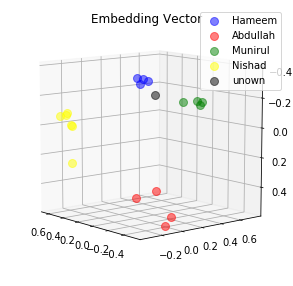

0.1131274625658989
0.14380709826946259
0.1526220738887787
0.1874818205833435
Average distance is  0.14925961382687092
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.44169107040141
No of Faces Detected :  1
probability :  0.94117045
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4392974  -0.22070149 -0.3134754 ]]


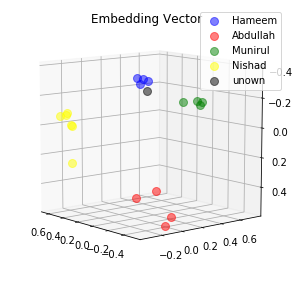

0.09514021873474121
0.11124327778816223
0.12758319079875946
0.1464901864528656
Average distance is  0.12011421844363213
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.63803046362647
No of Faces Detected :  1
probability :  0.9408378
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47100246 -0.21685614 -0.2906779 ]]


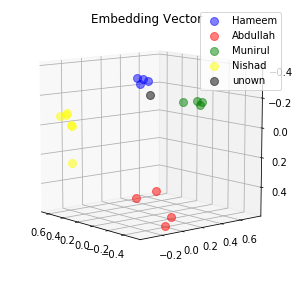

0.10176685452461243
0.12020780146121979
0.13673768937587738
0.1629149615764618
Average distance is  0.13040682673454285
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.04722551914103
No of Faces Detected :  1
probability :  0.9403032
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48730323 -0.21642599 -0.27772555]]


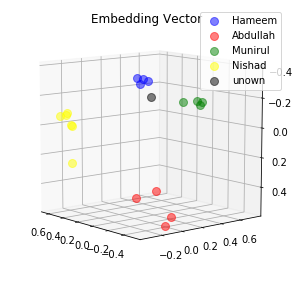

0.11112900078296661
0.128956139087677
0.14552463591098785
0.17404744029045105
Average distance is  0.13991430401802063
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.69058328751694
No of Faces Detected :  1
probability :  0.947908
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4971964  -0.20960143 -0.28181893]]


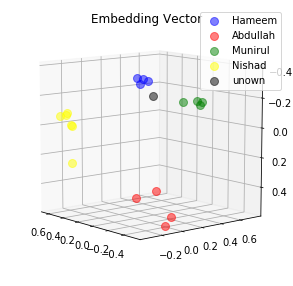

0.10979844629764557
0.13251343369483948
0.14600463211536407
0.1776096373796463
Average distance is  0.14148153737187386
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.62974964844426
No of Faces Detected :  1
probability :  0.9600867
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49057585 -0.22352129 -0.26290956]]


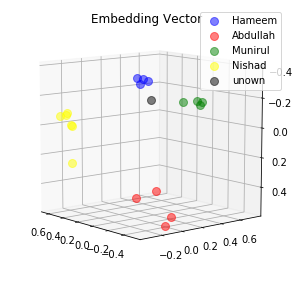

0.12267398089170456
0.13483165204524994
0.15425285696983337
0.18105603754520416
Average distance is  0.148203631862998
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.15992326850273
No of Faces Detected :  1
probability :  0.9691302
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48158628 -0.20845002 -0.26456976]]


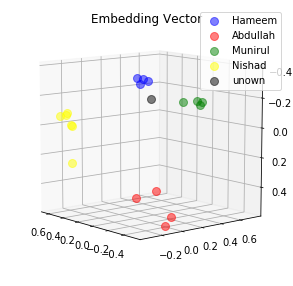

0.12679709494113922
0.14349748194217682
0.16125468909740448
0.1882794201374054
Average distance is  0.15495717152953148
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.97163768760754
No of Faces Detected :  1
probability :  0.9693873
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48101404 -0.2153527  -0.27806488]]


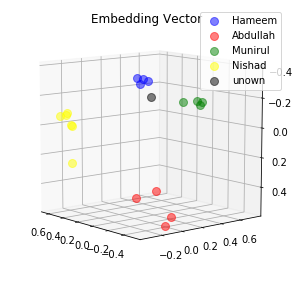

0.11187054216861725
0.1292433738708496
0.14633682370185852
0.17372094094753265
Average distance is  0.1402929201722145
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.63009949344167
No of Faces Detected :  1
probability :  0.9710287
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5009266  -0.2045734  -0.28136045]]


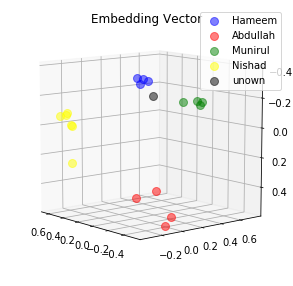

0.11258266866207123
0.13726498186588287
0.1495673805475235
0.18225251138210297
Average distance is  0.14541688561439514
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.01370945829702
No of Faces Detected :  1
probability :  0.9728653
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5086278  -0.21309689 -0.29026908]]


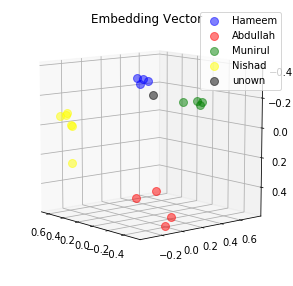

0.10147422552108765
0.12688098847866058
0.13782118260860443
0.17219173908233643
Average distance is  0.13459203392267227
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.60689267926858
No of Faces Detected :  1
probability :  0.9749761
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4996904  -0.24522495 -0.3204601 ]]


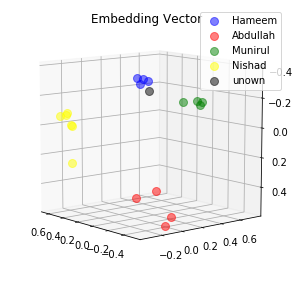

0.061594218015670776
0.08236037194728851
0.09386967122554779
0.12738503515720367
Average distance is  0.09130232408642769
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.88154156953849
No of Faces Detected :  1
probability :  0.97679853
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.50205725 -0.239528   -0.30286133]]


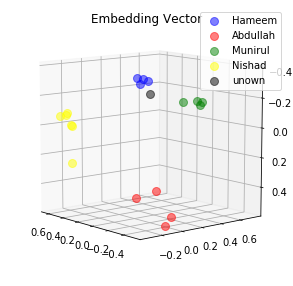

0.08011649549007416
0.09761457145214081
0.1118168830871582
0.1438022255897522
Average distance is  0.10833754390478134
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.039384077141804
No of Faces Detected :  1
probability :  0.9774394
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47689804 -0.24414973 -0.30420393]]


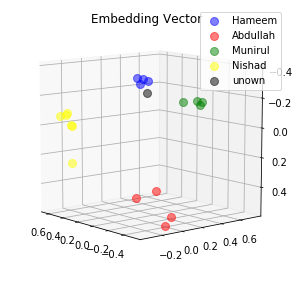

0.07992306351661682
0.0903385728597641
0.1096503883600235
0.1347455382347107
Average distance is  0.10366439074277878
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.53301292025243
No of Faces Detected :  1
probability :  0.97762585
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47775656 -0.23710999 -0.30237374]]


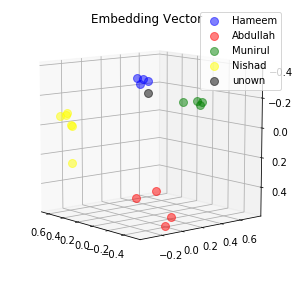

0.0829024687409401
0.09686318784952164
0.11468277871608734
0.14095716178417206
Average distance is  0.10885139927268028
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.49597488847613
No of Faces Detected :  1
probability :  0.98011386
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4911169  -0.24171917 -0.3097765 ]]


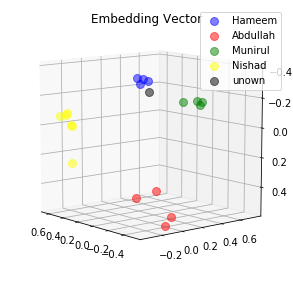

0.07279721647500992
0.0895434096455574
0.10468930006027222
0.13477963209152222
Average distance is  0.10045238956809044
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.15540970022526
No of Faces Detected :  1
probability :  0.97978216
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4785644  -0.2652821  -0.29926836]]


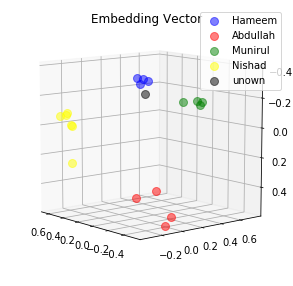

0.08368076384067535
0.07980158179998398
0.105172298848629
0.12586545944213867
Average distance is  0.09863002598285675
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.31376699458604
No of Faces Detected :  1
probability :  0.98123246
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49596468 -0.23435225 -0.30524153]]


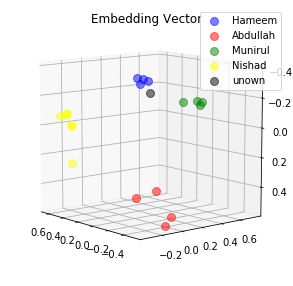

0.07889343798160553
0.0988144502043724
0.11247318983078003
0.14408841729164124
Average distance is  0.1085673738270998
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.992529888620595
No of Faces Detected :  1
probability :  0.98872256
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48040634 -0.27812448 -0.29785982]]


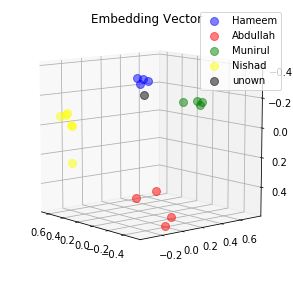

0.08687003701925278
0.07436885684728622
0.1029268130660057
0.1207958236336708
Average distance is  0.09624038264155388
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.50504995525912
No of Faces Detected :  1
probability :  0.98834205
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4726333  -0.22148868 -0.30218333]]


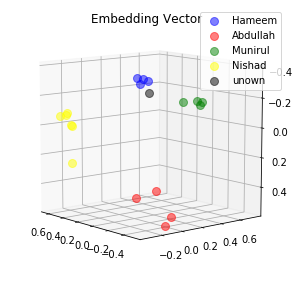

0.08936203271150589
0.10959969460964203
0.12472648918628693
0.15183062851428986
Average distance is  0.11887971125543118
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.315832749104715
No of Faces Detected :  1
probability :  0.98893493
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.46837008 -0.21134444 -0.2736025 ]]


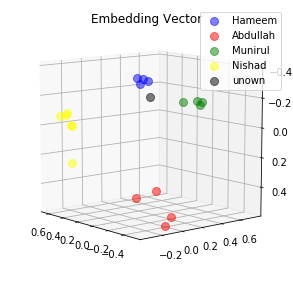

0.11973658949136734
0.13554932177066803
0.15397053956985474
0.17876127362251282
Average distance is  0.14700443111360073
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.48870140138965
No of Faces Detected :  1
probability :  0.9891618
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.45818788 -0.20669337 -0.30548185]]


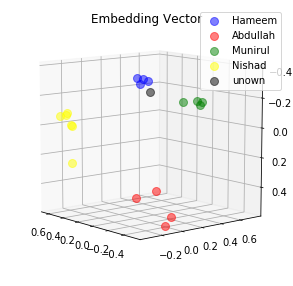

0.09814204275608063
0.12196563184261322
0.13527993857860565
0.1607784777879715
Average distance is  0.12904152274131775
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.81683902154186
No of Faces Detected :  1
probability :  0.98966324
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.44600454 -0.2117547  -0.2914961 ]]


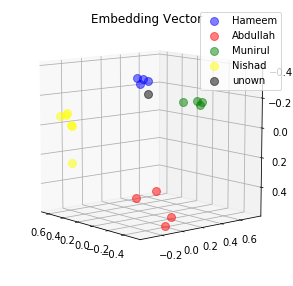

0.1118585467338562
0.1277369111776352
0.14568756520748138
0.16655702888965607
Average distance is  0.1379600130021572
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.29681080200605
No of Faces Detected :  1
probability :  0.98965305
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4459131  -0.20173056 -0.32359114]]


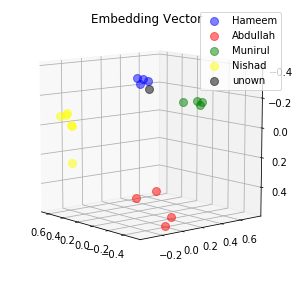

0.09398749470710754
0.12161201983690262
0.13149166107177734
0.15546974539756775
Average distance is  0.1256402302533388
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.62938764980967
No of Faces Detected :  1
probability :  0.98928493
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.44670832 -0.20503624 -0.32231164]]


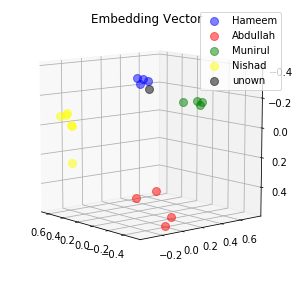

0.09245025366544724
0.11886178702116013
0.12951605021953583
0.15324892103672028
Average distance is  0.12351925298571587
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.72056395930829
No of Faces Detected :  1
probability :  0.9891913
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.44124538 -0.19933368 -0.32039386]]


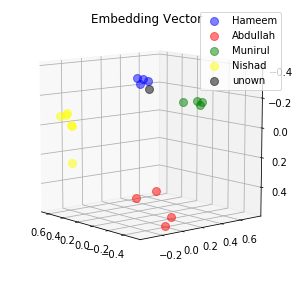

0.09984291344881058
0.12616224586963654
0.13684596121311188
0.1596870720386505
Average distance is  0.13063454814255238
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.666646259235705
No of Faces Detected :  1
probability :  0.98904705
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.44148865 -0.17821062 -0.31932214]]


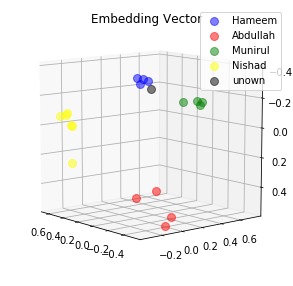

0.11385717988014221
0.14555415511131287
0.15330418944358826
0.1783846765756607
Average distance is  0.147775050252676
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.51026747673931
No of Faces Detected :  1
probability :  0.98966706
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.44423068 -0.18222585 -0.32125476]]


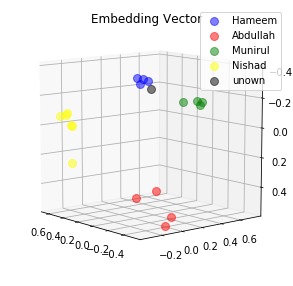

0.10872528702020645
0.1405913531780243
0.1482076346874237
0.1736655831336975
Average distance is  0.142797464504838
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.8802734617168
No of Faces Detected :  1
probability :  0.9897925
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.43012396 -0.15620443 -0.3382603 ]]


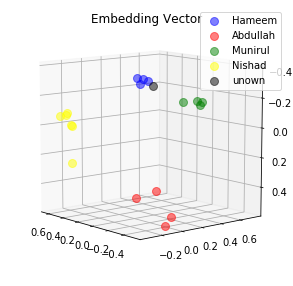

0.1277490258216858
0.16483451426029205
0.1674102544784546
0.19223354756832123
Average distance is  0.16305683553218842
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.391098905088306
No of Faces Detected :  1
probability :  0.98891616
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.42538002 -0.16496937 -0.3330204 ]]


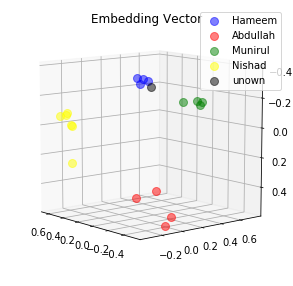

0.12547773122787476
0.15906424820423126
0.1640125960111618
0.1869095116853714
Average distance is  0.1588660217821598
end distance calcul
PREDICTION :  Hameem 
 percentange :  47.917382580377875
No of Faces Detected :  1
probability :  0.9883069
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.43316135 -0.16938245 -0.3409939 ]]


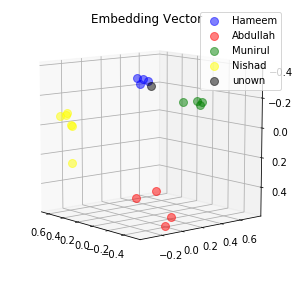

0.11496524512767792
0.15109063684940338
0.15409618616104126
0.1786094456911087
Average distance is  0.14969037845730782
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.48293273073042
No of Faces Detected :  1
probability :  0.9871416
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4432322  -0.17085616 -0.3333767 ]]


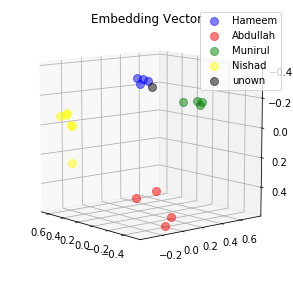

0.11164119839668274
0.14836999773979187
0.15210744738578796
0.17874126136302948
Average distance is  0.147714976221323
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.723002516523195
No of Faces Detected :  1
probability :  0.98469007
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.43468586 -0.1894911  -0.34953183]]


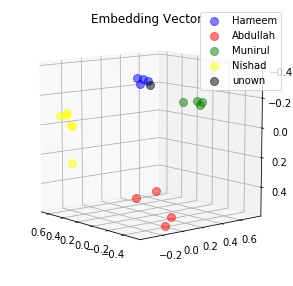

0.09640989452600479
0.13058079779148102
0.1337018460035324
0.15683376789093018
Average distance is  0.1293815765529871
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.53597311677494
No of Faces Detected :  1
probability :  0.9802089
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4572639  -0.20679918 -0.3342053 ]]


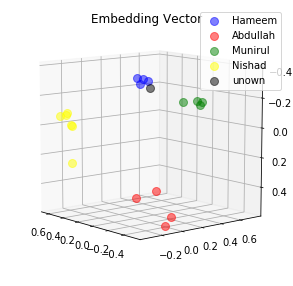

0.07869204878807068
0.11110074818134308
0.11782112717628479
0.14507944881916046
Average distance is  0.11317334324121475
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.656779787043085
No of Faces Detected :  1
probability :  0.97442186
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4493738  -0.17531222 -0.33173746]]


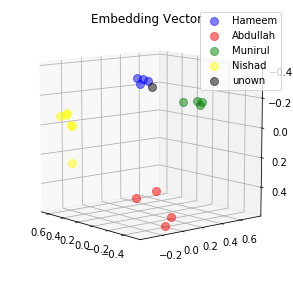

0.10613235831260681
0.1431378871202469
0.14707060158252716
0.17479495704174042
Average distance is  0.14278395101428032
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.96677255109991
No of Faces Detected :  1
probability :  0.97148186
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.46724924 -0.1574448  -0.33978352]]


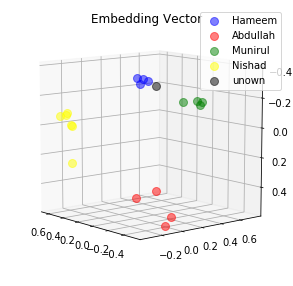

0.11155759543180466
0.15654356777668
0.1550159752368927
0.18802854418754578
Average distance is  0.15278642065823078
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.07174552467632
No of Faces Detected :  1
probability :  0.96891665
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.44583195 -0.16429155 -0.3465942 ]]


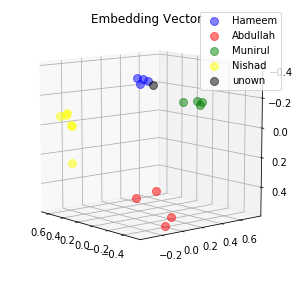

0.11088809370994568
0.1519523411989212
0.1518784910440445
0.17994938790798187
Average distance is  0.1486670784652233
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.254088188771334
No of Faces Detected :  1
probability :  0.96853566
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4359752  -0.19859771 -0.34227678]]


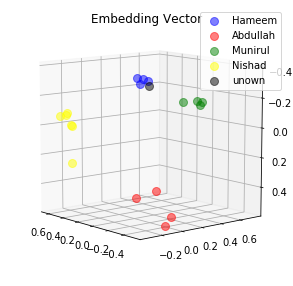

0.09216468781232834
0.12273331731557846
0.12872380018234253
0.15100370347499847
Average distance is  0.12365637719631195
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.16817947945072
No of Faces Detected :  1
probability :  0.9651797
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.44781163 -0.21247166 -0.3518531 ]]


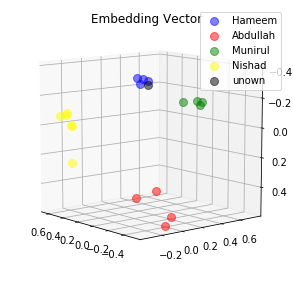

0.07168855518102646
0.10453121364116669
0.10842569172382355
0.1329859346151352
Average distance is  0.10440784879028797
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.370682861392105
No of Faces Detected :  1
probability :  0.9664809
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4435304  -0.195783   -0.33893064]]


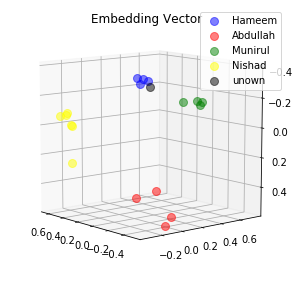

0.0908508226275444
0.12362198531627655
0.129156231880188
0.153823584318161
Average distance is  0.12436315603554249
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.992422738964265
No of Faces Detected :  1
probability :  0.96714604
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.450019   -0.23008084 -0.3523074 ]]


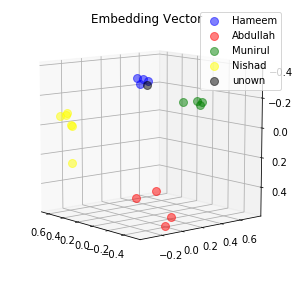

0.060340844094753265
0.08719028532505035
0.09375771880149841
0.11661168187856674
Average distance is  0.0894751325249672
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.08080937997842
No of Faces Detected :  1
probability :  0.97197866
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.43814826 -0.2169839  -0.3503686 ]]


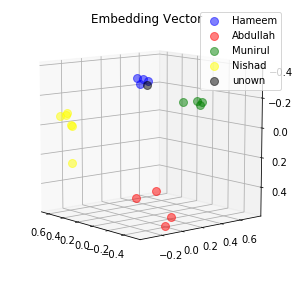

0.07658270001411438
0.10380104184150696
0.11023127287626266
0.13084545731544495
Average distance is  0.10536511801183224
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.556884865520814
No of Faces Detected :  1
probability :  0.97862464
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4363988  -0.18326117 -0.36009502]]


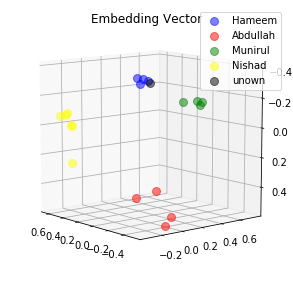

0.09707129746675491
0.1351572722196579
0.13477151095867157
0.15916040539741516
Average distance is  0.13154012151062489
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.89085423511859
No of Faces Detected :  1
probability :  0.9816483
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4538295  -0.20544645 -0.33499733]]


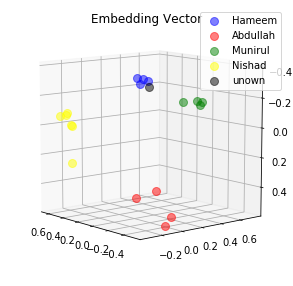

0.08083342760801315
0.11286623775959015
0.11960510909557343
0.14604325592517853
Average distance is  0.11483700759708881
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.40441749064372
No of Faces Detected :  1
probability :  0.983492
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.45781395 -0.17479914 -0.35261732]]


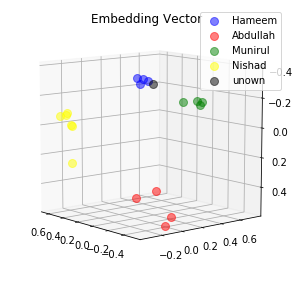

0.09499939531087875
0.138891339302063
0.13687676191329956
0.16744305193424225
Average distance is  0.1345526371151209
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.81619392499876
No of Faces Detected :  1
probability :  0.98701656
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4651298  -0.19005458 -0.30990446]]


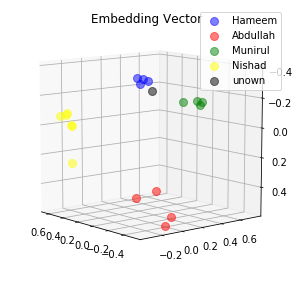

0.10231874883174896
0.13384369015693665
0.14271819591522217
0.17185132205486298
Average distance is  0.1376829892396927
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.59634847175238
No of Faces Detected :  1
probability :  0.98937345
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4490204  -0.20108527 -0.32030535]]


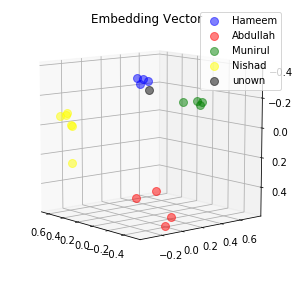

0.09482457488775253
0.12254563719034195
0.1327216774225235
0.1574403941631317
Average distance is  0.12688307091593742
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.81473245059158
No of Faces Detected :  1
probability :  0.99054116
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4700942  -0.20066485 -0.30974326]]


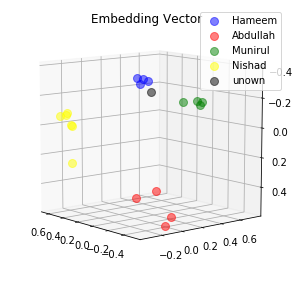

0.09433868527412415
0.12392206490039825
0.1339135318994522
0.1633135825395584
Average distance is  0.12887196615338326
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.636751065425734
No of Faces Detected :  1
probability :  0.99102104
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47537714 -0.18773879 -0.30555886]]


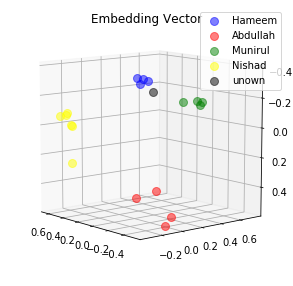

0.1043860912322998
0.1371397227048874
0.14540523290634155
0.17666825652122498
Average distance is  0.14089982584118843
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.44195521937487
No of Faces Detected :  1
probability :  0.98885393
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.44275227 -0.16784447 -0.2822137 ]]


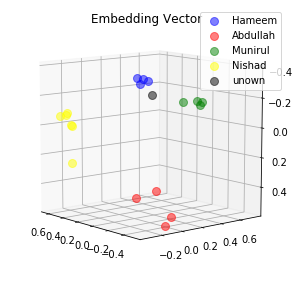

0.1432102918624878
0.16934171319007874
0.18209320306777954
0.2066667377948761
Average distance is  0.17532798647880554
end distance calcul
PREDICTION :  Hameem 
 percentange :  47.41006553801002
No of Faces Detected :  1
probability :  0.9885586
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.39225882 -0.1717474  -0.3216429 ]]


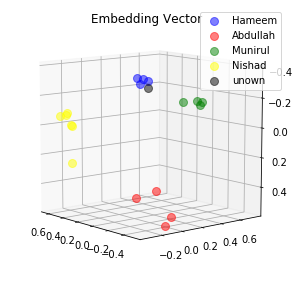

0.14669042825698853
0.16971895098686218
0.18019221723079681
0.19470033049583435
Average distance is  0.17282548174262047
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.07425250413264
No of Faces Detected :  1
probability :  0.9879465
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.35689047 -0.17862843 -0.3067388 ]]


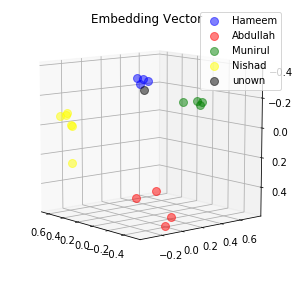

0.17592327296733856
0.18909984827041626
0.20446138083934784
0.2110140025615692
Average distance is  0.19512462615966797
end distance calcul
PREDICTION :  Hameem 
 percentange :  47.47834386357469
No of Faces Detected :  1
probability :  0.98149896
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.43694356 -0.17420049 -0.28600582]]


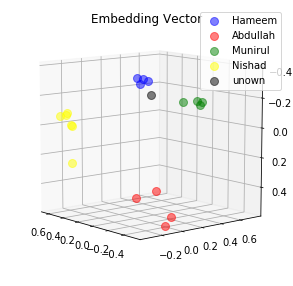

0.13903523981571198
0.1634891927242279
0.176979199051857
0.1999630630016327
Average distance is  0.1698666736483574
end distance calcul
PREDICTION :  Hameem 
 percentange :  47.55284223738084
No of Faces Detected :  1
probability :  0.9760643
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4643234  -0.17713577 -0.29579645]]


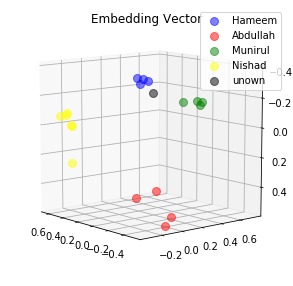

0.1209096685051918
0.15157967805862427
0.16143378615379333
0.19040171802043915
Average distance is  0.15608121268451214
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.26643582660034
No of Faces Detected :  1
probability :  0.9493902
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.46229076 -0.14811587 -0.30876324]]


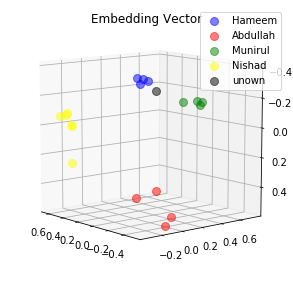

0.1349266767501831
0.17344282567501068
0.1777736097574234
0.20881135761737823
Average distance is  0.17373861744999886
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.988992184672504
No of Faces Detected :  1
probability :  0.869277
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.41103482 -0.14303991 -0.28843117]]


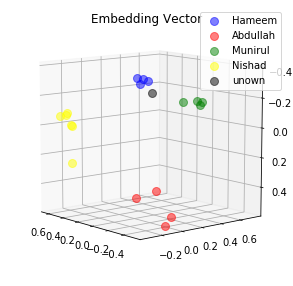

0.16953468322753906
0.19675196707248688
0.2078491896390915
0.2287588268518448
Average distance is  0.20072366669774055
end distance calcul
PREDICTION :  Hameem 
 percentange :  47.893869667367184
No of Faces Detected :  0
No of cropped_faces :  0
No of Faces Detected :  1
probability :  0.9081539
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.43401265 -0.19528557 -0.32303903]]


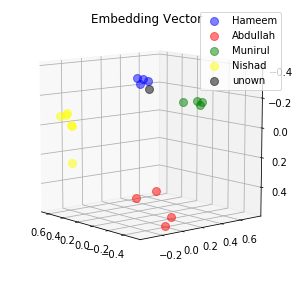

0.10479841381311417
0.13117673993110657
0.14134904742240906
0.16287145018577576
Average distance is  0.1350489128381014
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.961661093205514
No of Faces Detected :  1
probability :  0.9446645
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4337259  -0.19790019 -0.3274123 ]]


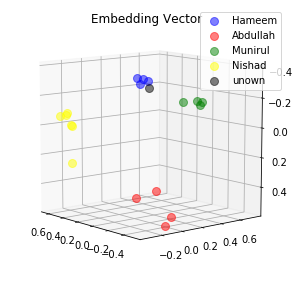

0.10107234120368958
0.1276329904794693
0.13729041814804077
0.15856032073497772
Average distance is  0.13113901764154434
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.77165941993683
No of Faces Detected :  1
probability :  0.962431
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.43311736 -0.20409442 -0.32338318]]


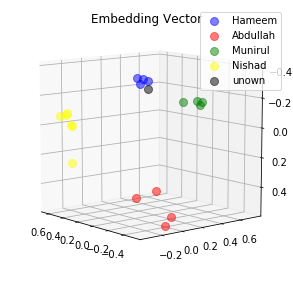

0.10020655393600464
0.12363846600055695
0.1352718025445938
0.15539945662021637
Average distance is  0.12862906977534294
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.941488113843604
No of Faces Detected :  1
probability :  0.97192097
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.43792546 -0.20122354 -0.32915613]]


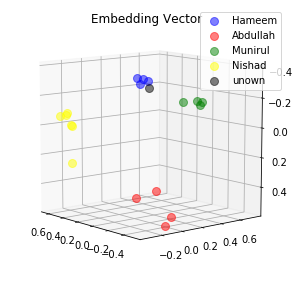

0.09563338756561279
0.12272919714450836
0.13209524750709534
0.15416620671749115
Average distance is  0.1261560097336769
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.33660214798224
No of Faces Detected :  1
probability :  0.97559416
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.44720256 -0.21474807 -0.31395584]]


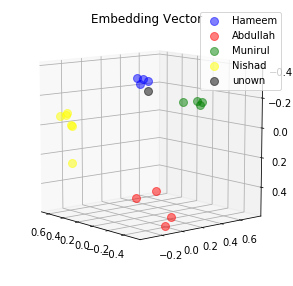

0.09287818521261215
0.11353406310081482
0.12780606746673584
0.14990589022636414
Average distance is  0.12103105150163174
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.92814556965339
No of Faces Detected :  1
probability :  0.9760885
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.45197648 -0.15722057 -0.3255225 ]]


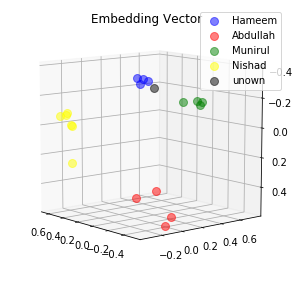

0.12234104424715042
0.16139306128025055
0.1644352227449417
0.19366343319416046
Average distance is  0.16045819036662579
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.612217559604204
No of Faces Detected :  1
probability :  0.97102034
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.44702956 -0.18194023 -0.28837943]]


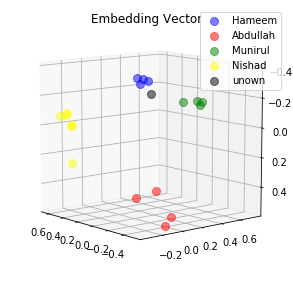

0.1287483274936676
0.1534966379404068
0.16690278053283691
0.19135871529579163
Average distance is  0.16012661531567574
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.71083406578104
No of Faces Detected :  1
probability :  0.96279895
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.46869308 -0.19488035 -0.2772801 ]]


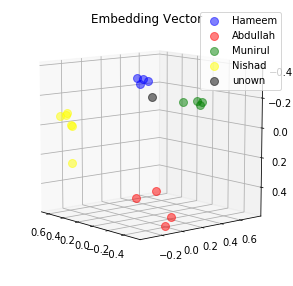

0.12379675358533859
0.14590784907341003
0.1610317826271057
0.18800149857997894
Average distance is  0.15468447096645832
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.00260098805098
No of Faces Detected :  1
probability :  0.93325377
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47351903 -0.18785353 -0.25141174]]


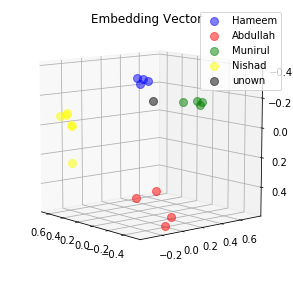

0.14844194054603577
0.1675586998462677
0.1846577376127243
0.2112436294555664
Average distance is  0.17797550186514854
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.14325106167691
No of Faces Detected :  1
probability :  0.8617769
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4774123  -0.22328933 -0.24007764]]


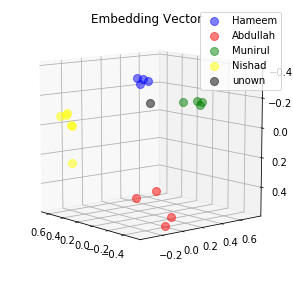

0.14587000012397766
0.15237775444984436
0.17550422251224518
0.19790658354759216
Average distance is  0.16791464015841484
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.79778943737641
No of Faces Detected :  1
probability :  0.9732722
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4630906  -0.20250082 -0.2651003 ]]


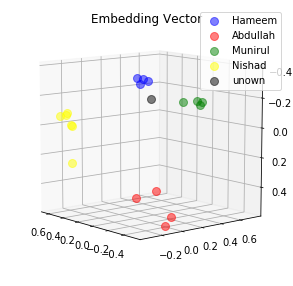

0.13205303251743317
0.148231640458107
0.16679562628269196
0.19089670479297638
Average distance is  0.15949425101280212
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.86926179128584
No of Faces Detected :  1
probability :  0.99506056
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.42847875 -0.19423734 -0.2899915 ]]


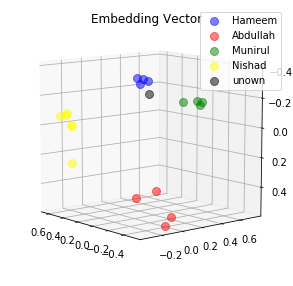

0.12936364114284515
0.1476030796766281
0.16410185396671295
0.1831372231245041
Average distance is  0.15605144947767258
end distance calcul
PREDICTION :  Hameem 
 percentange :  47.73979205104138
No of Faces Detected :  1
probability :  0.99815625
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4428489  -0.22752745 -0.27224198]]


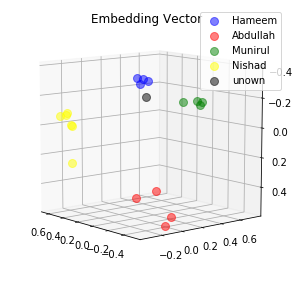

0.12433692067861557
0.12960784137248993
0.15335336327552795
0.16999226808547974
Average distance is  0.1443225983530283
end distance calcul
PREDICTION :  Hameem 
 percentange :  47.85419623365461
No of Faces Detected :  1
probability :  0.99907005
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47726437 -0.19720191 -0.25379446]]


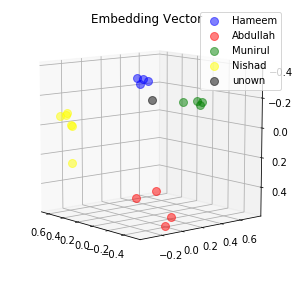

0.14164124429225922
0.15904153883457184
0.1768520176410675
0.20336394011974335
Average distance is  0.17022468522191048
end distance calcul
PREDICTION :  Hameem 
 percentange :  47.04838372534577
No of Faces Detected :  1
probability :  0.99890625
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.486018   -0.17796357 -0.22737432]]


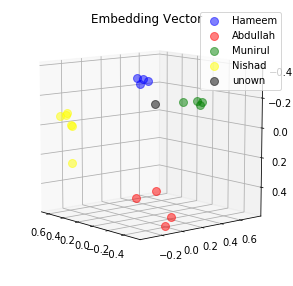

0.17291474342346191
0.19146287441253662
0.2088112086057663
0.23652200400829315
Average distance is  0.2024277076125145
end distance calcul
PREDICTION :  Hameem 
 percentange :  46.62531664860431
No of Faces Detected :  1
probability :  0.99855995
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48083615 -0.24370503 -0.23206885]]


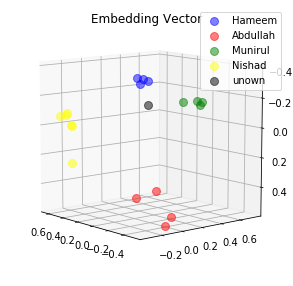

0.15004482865333557
0.14860843122005463
0.17499952018260956
0.1945284754037857
Average distance is  0.16704531386494637
end distance calcul
PREDICTION :  Hameem 
 percentange :  47.770515002277186
No of Faces Detected :  1
probability :  0.99866337
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.45001903 -0.2019499  -0.2421861 ]]


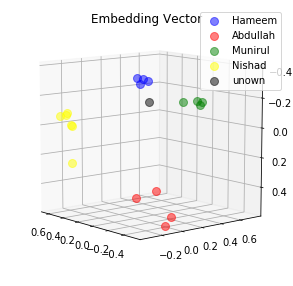

0.1560448259115219
0.1665235310792923
0.1885221302509308
0.20873264968395233
Average distance is  0.17995578423142433
end distance calcul
PREDICTION :  Hameem 
 percentange :  45.87427176475497
No of Faces Detected :  1
probability :  0.99889016
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.44064984 -0.19090606 -0.21591027]]


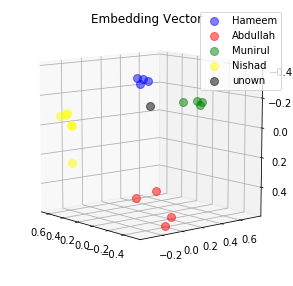

0.1860387772321701
0.19492819905281067
0.2181558758020401
0.2367885559797287
Average distance is  0.2089778520166874
end distance calcul
PREDICTION :  Hameem 
 percentange :  43.205566031209116
No of Faces Detected :  1
probability :  0.9991832
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.44832334 -0.19945474 -0.22715925]]


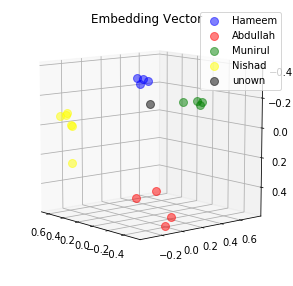

0.1708226203918457
0.1796543002128601
0.20268921554088593
0.2221267968416214
Average distance is  0.19382323324680328
end distance calcul
PREDICTION :  Hameem 
 percentange :  44.10570726297499
No of Faces Detected :  1
probability :  0.9983001
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48548898 -0.20530449 -0.2287651 ]]


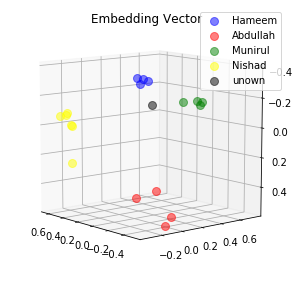

0.16093532741069794
0.17235904932022095
0.19312654435634613
0.21822723746299744
Average distance is  0.1861620396375656
end distance calcul
PREDICTION :  Hameem 
 percentange :  45.94465336042365
No of Faces Detected :  1
probability :  0.9929497
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4617043  -0.20250492 -0.2296453 ]]


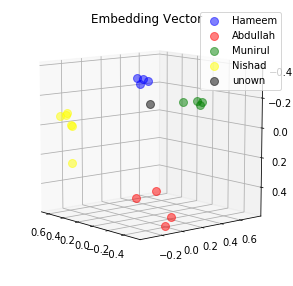

0.1642809957265854
0.17406970262527466
0.19638393819332123
0.2178989052772522
Average distance is  0.18815838545560837
end distance calcul
PREDICTION :  Hameem 
 percentange :  46.35388249019568
No of Faces Detected :  1
probability :  0.97426677
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49353045 -0.17563327 -0.15543878]]


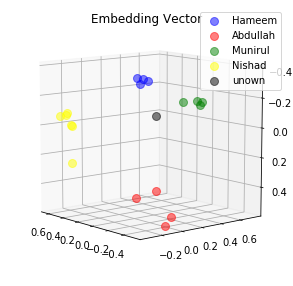

0.23963563144207
0.2496359497308731
0.27158015966415405
0.29589515924453735
Average distance is  0.26418672502040863
end distance calcul
PREDICTION :  Hameem 
 percentange :  42.20854407768378
No of Faces Detected :  1
probability :  0.8610023
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4767952  -0.206231   -0.20954876]]


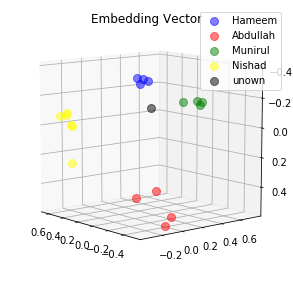

0.1796397566795349
0.1871831864118576
0.21031621098518372
0.23262594640254974
Average distance is  0.2024412751197815
end distance calcul
PREDICTION :  Hameem 
 percentange :  43.73887399395721
No of Faces Detected :  1
probability :  0.9260001
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4528707  -0.19774984 -0.16751072]]


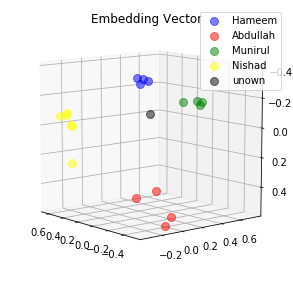

0.22550025582313538
0.22872526943683624
0.25477784872055054
0.27248498797416687
Average distance is  0.24537209048867226
end distance calcul
PREDICTION :  Hameem 
 percentange :  40.8142197653948
No of Faces Detected :  1
probability :  0.90160096
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4448486  -0.17509352 -0.20877618]]


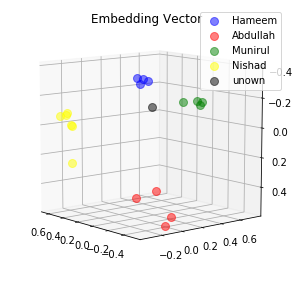

0.1972673088312149
0.2096042037010193
0.231184184551239
0.2518330514431
Average distance is  0.2224721871316433
end distance calcul
PREDICTION :  Hameem 
 percentange :  41.556450398773755
No of Faces Detected :  1
probability :  0.8884531
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49022642 -0.19064854 -0.20552158]]


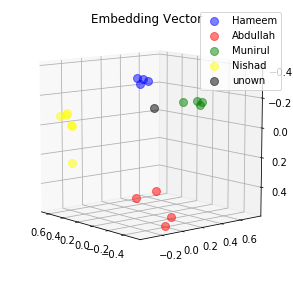

0.1875276118516922
0.19991616904735565
0.22037099301815033
0.24599654972553253
Average distance is  0.21345283091068268
end distance calcul
PREDICTION :  Hameem 
 percentange :  43.415091073370974
No of Faces Detected :  1
probability :  0.9139812
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4488292  -0.22499017 -0.19719838]]


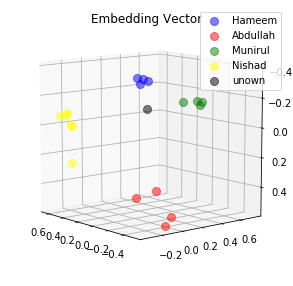

0.19218966364860535
0.19046247005462646
0.21850191056728363
0.2335086166858673
Average distance is  0.2086656652390957
end distance calcul
PREDICTION :  Hameem 
 percentange :  42.91713597038122
No of Faces Detected :  1
probability :  0.95626104
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.44520485 -0.23341733 -0.19901018]]


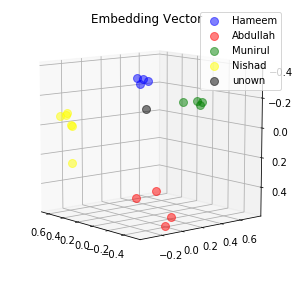

0.1901494413614273
0.1857723593711853
0.21494854986667633
0.22829033434391022
Average distance is  0.2047901712357998
end distance calcul
PREDICTION :  Hameem 
 percentange :  42.54623298035576
No of Faces Detected :  1
probability :  0.97119975
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.3851037  -0.19234508 -0.16920407]]


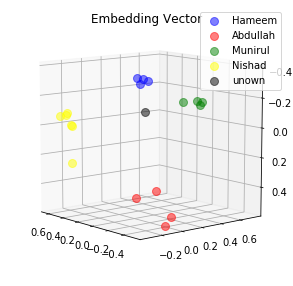

0.24741527438163757
0.24690167605876923
0.2749650478363037
0.28415346145629883
Average distance is  0.26335886493325233
end distance calcul
PREDICTION :  Hameem 
 percentange :  37.03159399510441
No of Faces Detected :  1
probability :  0.9756812
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.34563246 -0.1792667  -0.14149484]]


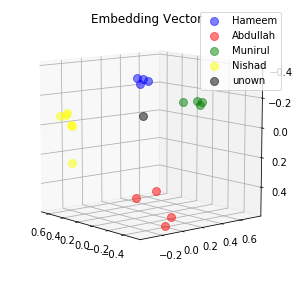

0.29303643107414246
0.2911137342453003
0.3197545111179352
0.3255162239074707
Average distance is  0.30735522508621216
end distance calcul
PREDICTION :  Hameem 
 percentange :  34.80877189527967
No of Faces Detected :  1
probability :  0.98553455
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.35057053 -0.18290518 -0.12754637]]


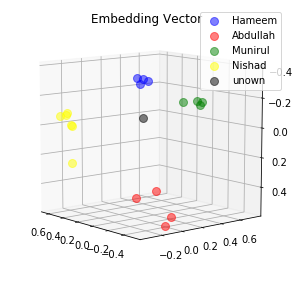

0.301209032535553
0.2981908917427063
0.32752764225006104
0.33349013328552246
Average distance is  0.3151044249534607
end distance calcul
PREDICTION :  Hameem 
 percentange :  34.425315556947155
No of Faces Detected :  1
probability :  0.9904072
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.3528157  -0.18038873 -0.1173849 ]]


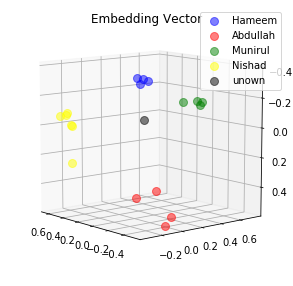

0.3093690276145935
0.3064574599266052
0.33587127923965454
0.34233567118644714
Average distance is  0.3235083594918251
end distance calcul
PREDICTION :  Hameem 
 percentange :  33.97249378473066
No of Faces Detected :  1
probability :  0.9951532
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.33896634 -0.17792726 -0.10396603]]


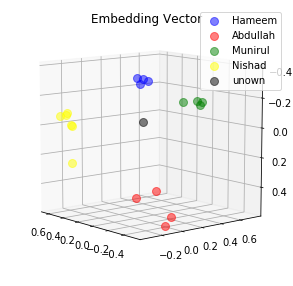

0.3278629779815674
0.3241017758846283
0.3538908362388611
0.35918277502059937
Average distance is  0.34125959128141403
end distance calcul
PREDICTION :  unkown 
 percentange :  33.146486754023755
No of Faces Detected :  1
probability :  0.9964807
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.3274339  -0.1854393  -0.10399594]]


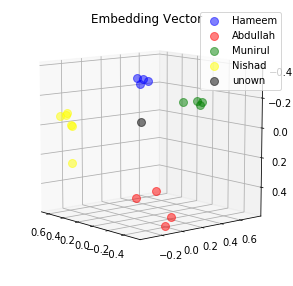

0.3318033218383789
0.3262232840061188
0.35666054487228394
0.3600870966911316
Average distance is  0.3436935618519783
end distance calcul
PREDICTION :  unkown 
 percentange :  33.192956918341956
No of Faces Detected :  1
probability :  0.99727094
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.33363464 -0.17054313 -0.10548691]]


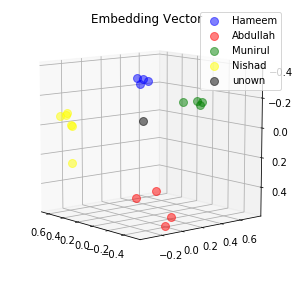

0.33102962374687195
0.32832497358322144
0.3576016128063202
0.3630523085594177
Average distance is  0.3450021296739578
end distance calcul
PREDICTION :  unkown 
 percentange :  32.874105146089214
No of Faces Detected :  1
probability :  0.9978541
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.35648122 -0.17530544 -0.13938431]]


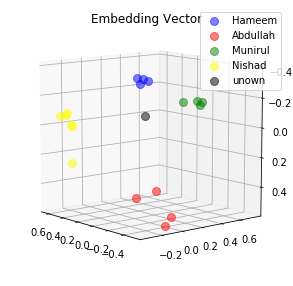

0.2904774844646454
0.2898173928260803
0.318052738904953
0.3254449963569641
Average distance is  0.3059481531381607
end distance calcul
PREDICTION :  Hameem 
 percentange :  35.818458718124425
No of Faces Detected :  1
probability :  0.9987279
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.27255806 -0.13168137 -0.1141952 ]]


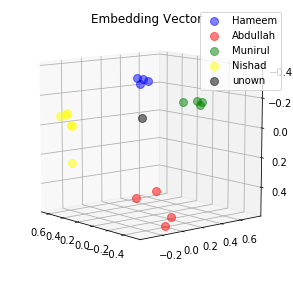

0.3696589469909668
0.37048107385635376
0.3972500264644623
0.40039390325546265
Average distance is  0.38444598764181137
end distance calcul
PREDICTION :  unkown 
 percentange :  31.25648758390381
No of Faces Detected :  1
probability :  0.9987344
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.36542642 -0.17612074 -0.11387459]]


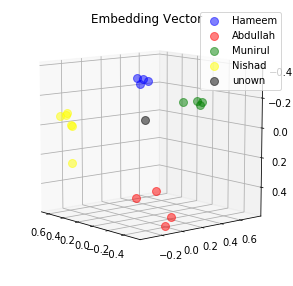

0.30789127945899963
0.3062558174133301
0.33523017168045044
0.34345099329948425
Average distance is  0.3232070654630661
end distance calcul
PREDICTION :  Hameem 
 percentange :  34.197473638099105
No of Faces Detected :  1
probability :  0.99844545
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.35440496 -0.14241236 -0.10931312]]


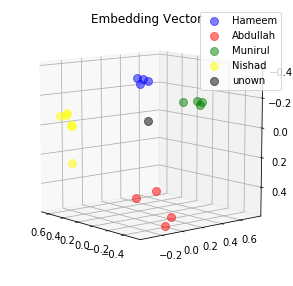

0.32687968015670776
0.33012545108795166
0.3568756580352783
0.36697158217430115
Average distance is  0.3452130928635597
end distance calcul
PREDICTION :  unkown 
 percentange :  33.51883416281971
No of Faces Detected :  1
probability :  0.9976903
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.43235287 -0.19961607 -0.1426227 ]]


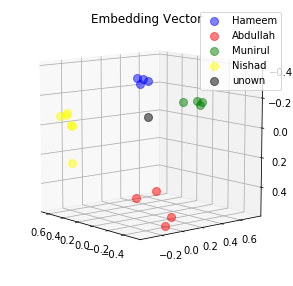

0.25307825207710266
0.2525283396244049
0.28067487478256226
0.29473456740379333
Average distance is  0.2702540084719658
end distance calcul
PREDICTION :  Hameem 
 percentange :  37.40478710960234
No of Faces Detected :  1
probability :  0.9970695
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.45728397 -0.21772267 -0.15459085]]


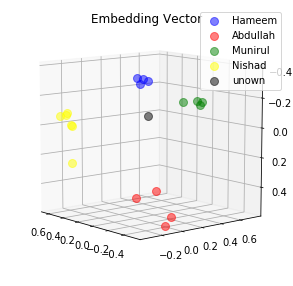

0.2327919602394104
0.23066695034503937
0.25892943143844604
0.27456149458885193
Average distance is  0.24923745915293694
end distance calcul
PREDICTION :  Hameem 
 percentange :  39.16122365950985
No of Faces Detected :  1
probability :  0.9980936
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48032522 -0.26291743 -0.14154078]]


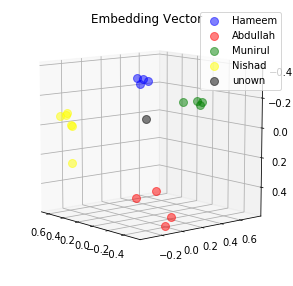

0.2397817224264145
0.22794362902641296
0.25899162888526917
0.2717803716659546
Average distance is  0.2496243380010128
end distance calcul
PREDICTION :  Hameem 
 percentange :  42.13211003314961
No of Faces Detected :  1
probability :  0.99810493
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5278162  -0.25901935 -0.19436215]]


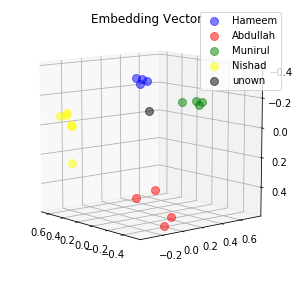

0.18912942707538605
0.1845611184835434
0.20959711074829102
0.2315712869167328
Average distance is  0.2037147358059883
end distance calcul
PREDICTION :  Hameem 
 percentange :  45.8780670644885
No of Faces Detected :  1
probability :  0.9988282
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.539107   -0.24330132 -0.14020367]]


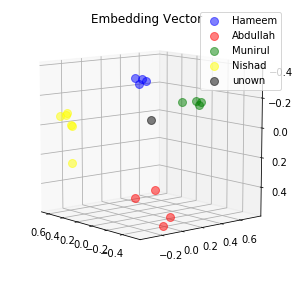

0.2448115348815918
0.24194784462451935
0.26688963174819946
0.2887992262840271
Average distance is  0.2606120593845844
end distance calcul
PREDICTION :  Hameem 
 percentange :  44.12526905021078
No of Faces Detected :  1
probability :  0.997912
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5195271  -0.23274961 -0.18038294]]


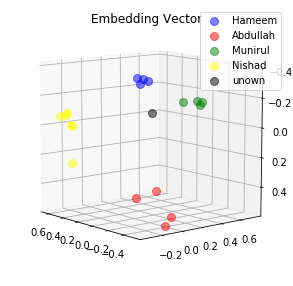

0.20324642956256866
0.20423518121242523
0.2282629907131195
0.25155365467071533
Average distance is  0.22182456403970718
end distance calcul
PREDICTION :  Hameem 
 percentange :  44.56135629017608
No of Faces Detected :  1
probability :  0.99213916
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49104053 -0.199713   -0.25260305]]


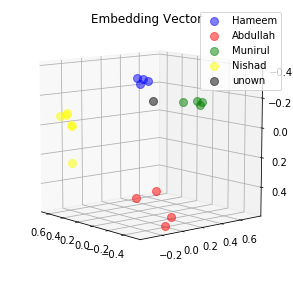

0.14053508639335632
0.15858612954616547
0.17552602291107178
0.20408570766448975
Average distance is  0.16968323662877083
end distance calcul
PREDICTION :  Hameem 
 percentange :  47.83228182260167
No of Faces Detected :  1
probability :  0.9628482
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48106632 -0.21866658 -0.24980778]]


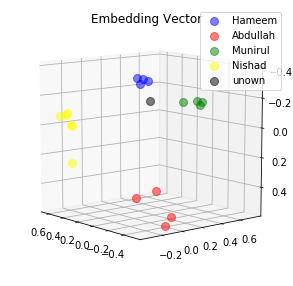

0.13729152083396912
0.1474553793668747
0.1686089187860489
0.1930459439754486
Average distance is  0.16160044074058533
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.993220543235196
No of Faces Detected :  1
probability :  0.9910095
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47530976 -0.18320854 -0.2611442 ]]


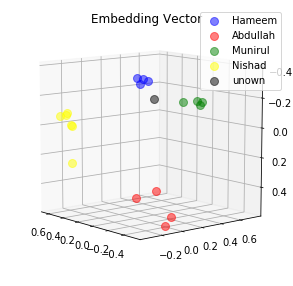

0.14213122427463531
0.16472069919109344
0.17978103458881378
0.20783419907093048
Average distance is  0.17361678928136826
end distance calcul
PREDICTION :  Hameem 
 percentange :  47.74358852668499
No of Faces Detected :  1
probability :  0.9967802
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4983539  -0.16386934 -0.24057767]]


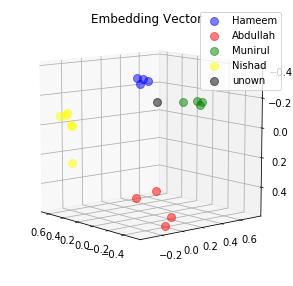

0.16842356324195862
0.19372116029262543
0.20687620341777802
0.2384088933467865
Average distance is  0.20185745507478714
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.17513899479757
No of Faces Detected :  1
probability :  0.99834263
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4587528  -0.16482237 -0.22218218]]


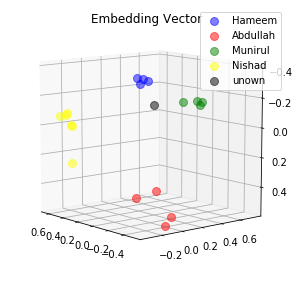

0.18722045421600342
0.20522867143154144
0.2235860973596573
0.247979536652565
Average distance is  0.2160036899149418
end distance calcul
PREDICTION :  Hameem 
 percentange :  45.665686085097406
No of Faces Detected :  1
probability :  0.99787235
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.45575544 -0.23538502 -0.29759365]]


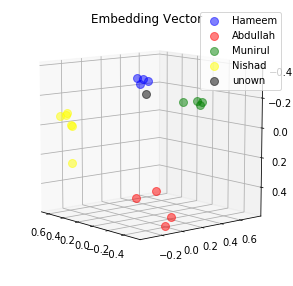

0.09484463930130005
0.10376638174057007
0.12473774701356888
0.14480678737163544
Average distance is  0.11703888885676861
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.02819375820858
No of Faces Detected :  1
probability :  0.99741566
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4807022  -0.17164744 -0.2500241 ]]


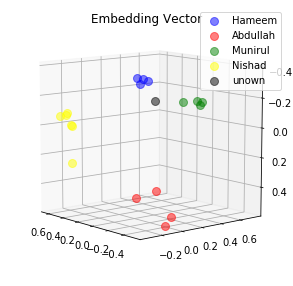

0.1569637656211853
0.1806895136833191
0.19517254829406738
0.2242354303598404
Average distance is  0.18926531448960304
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.15196619238429
No of Faces Detected :  1
probability :  0.99616414
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4338809  -0.1651329  -0.25858292]]


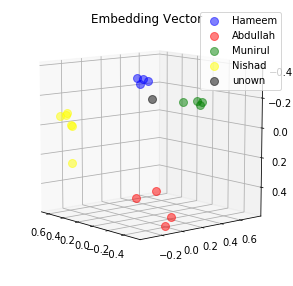

0.16503548622131348
0.18603169918060303
0.2022363692522049
0.22429205477237701
Average distance is  0.1943989023566246
end distance calcul
PREDICTION :  Hameem 
 percentange :  47.007644421660174
No of Faces Detected :  1
probability :  0.99707985
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.33182353 -0.14630665 -0.28754175]]


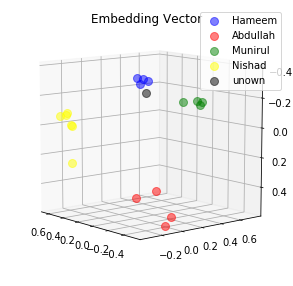

0.21880537271499634
0.23387384414672852
0.24905100464820862
0.25610610842704773
Average distance is  0.2394590824842453
end distance calcul
PREDICTION :  Hameem 
 percentange :  45.250737739736685
No of Faces Detected :  1
probability :  0.9962065
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.45116648 -0.16498037 -0.28470364]]


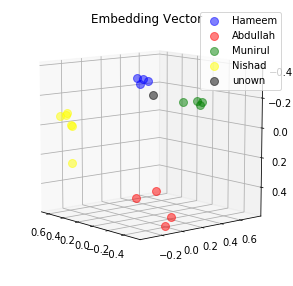

0.14043760299682617
0.16905055940151215
0.18036408722400665
0.2069549262523651
Average distance is  0.17420179396867752
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.02901658444541
No of Faces Detected :  1
probability :  0.9891592
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.37861907 -0.15590271 -0.2951346 ]]


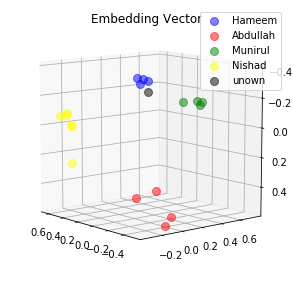

0.1769869029521942
0.19744279980659485
0.21087200939655304
0.22452984750270844
Average distance is  0.20245788991451263
end distance calcul
PREDICTION :  Hameem 
 percentange :  47.18805690016835
No of Faces Detected :  1
probability :  0.9079924
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5002624  -0.18745208 -0.3317239 ]]


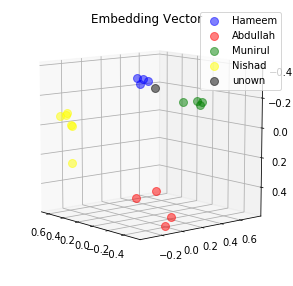

0.0853731706738472
0.1302492618560791
0.1292155236005783
0.1678657978773117
Average distance is  0.12817593850195408
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.383851468026286
No of Faces Detected :  1
probability :  0.99062055
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.40917292 -0.13439296 -0.31689274]]


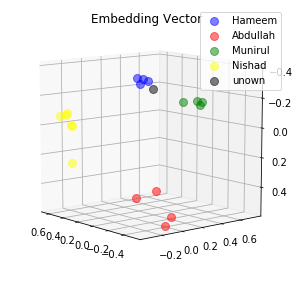

0.1632940173149109
0.19609597325325012
0.20217697322368622
0.2240324169397354
Average distance is  0.19639984518289566
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.79947786033455
No of Faces Detected :  1
probability :  0.9891813
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49677643 -0.17516972 -0.31765562]]


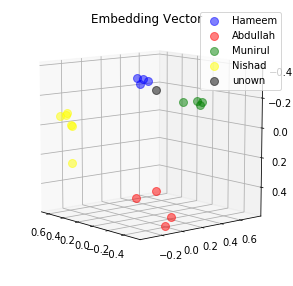

0.10349541157484055
0.1453903466463089
0.1469881236553192
0.18408836424350739
Average distance is  0.144990561529994
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.68505203122768
No of Faces Detected :  1
probability :  0.985706
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4917247  -0.2174713  -0.31659338]]


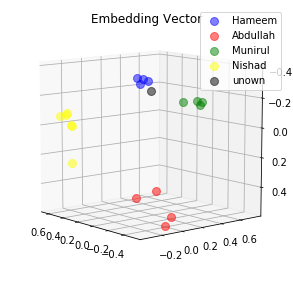

0.07557510584592819
0.1063895896077156
0.11464938521385193
0.14852307736873627
Average distance is  0.111284289509058
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.82254826469492
No of Faces Detected :  1
probability :  0.98227286
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.50724155 -0.23300675 -0.28833246]]


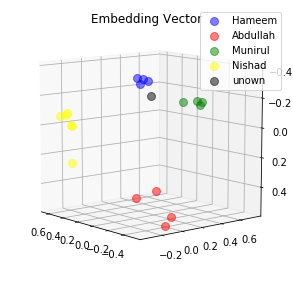

0.09621767699718475
0.11304012686014175
0.12796778976917267
0.15977540612220764
Average distance is  0.1242502499371767
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.083309003486946
No of Faces Detected :  1
probability :  0.96913207
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5109078  -0.20722774 -0.29908267]]


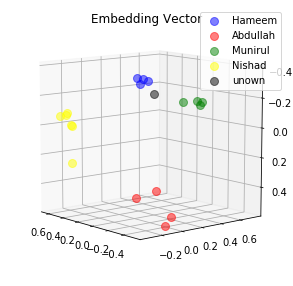

0.09693047404289246
0.12731069326400757
0.13521158695220947
0.17151351273059845
Average distance is  0.132741566747427
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.7942873176343
No of Faces Detected :  1
probability :  0.9577091
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5081989  -0.19879794 -0.3043082 ]]


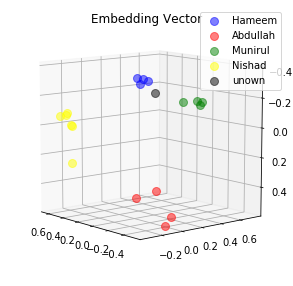

0.09699667990207672
0.13121642172336578
0.13715773820877075
0.17410650849342346
Average distance is  0.13486933708190918
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.58286343257855
No of Faces Detected :  1
probability :  0.9695709
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.45963076 -0.2227864  -0.32726207]]


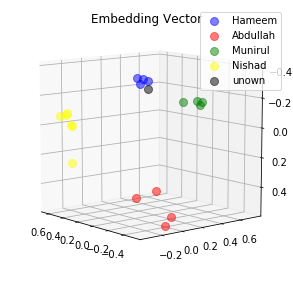

0.07317279279232025
0.09806200861930847
0.10936222970485687
0.1349550187587738
Average distance is  0.10388801246881485
end distance calcul
PREDICTION :  Hameem 
 percentange :  53.08885999393426
No of Faces Detected :  1
probability :  0.97712517
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4640144  -0.22345191 -0.3188653 ]]


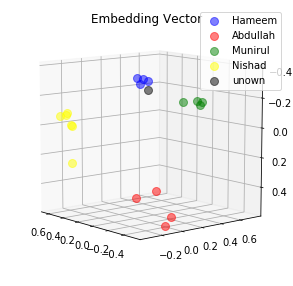

0.07732906937599182
0.1002202033996582
0.11321668326854706
0.13931970298290253
Average distance is  0.1075214147567749
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.372612744907
No of Faces Detected :  1
probability :  0.98176545
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47947574 -0.21614769 -0.33750743]]


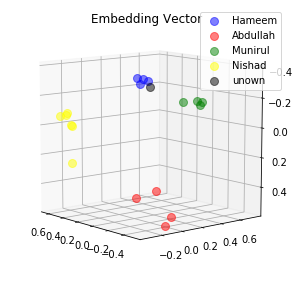

0.061823926866054535
0.09919027984142303
0.10318682342767715
0.1363949477672577
Average distance is  0.1001489944756031
end distance calcul
PREDICTION :  Hameem 
 percentange :  53.991066479843816
No of Faces Detected :  1
probability :  0.98362494
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49729726 -0.20806038 -0.3449449 ]]


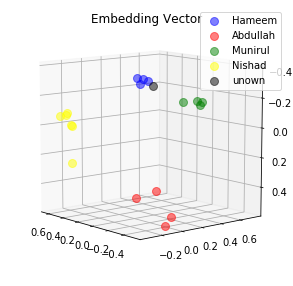

0.06082114577293396
0.10707296431064606
0.10467413812875748
0.14357678592205048
Average distance is  0.10403625853359699
end distance calcul
PREDICTION :  Hameem 
 percentange :  54.47729998786674
No of Faces Detected :  1
probability :  0.9859684
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4871557  -0.20391569 -0.35736206]]


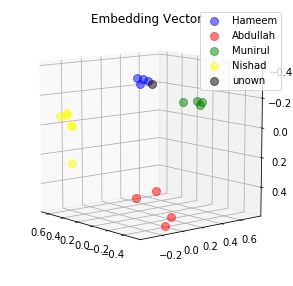

0.058831989765167236
0.1083306074142456
0.10311537235975266
0.14060291647911072
Average distance is  0.10272022150456905
end distance calcul
PREDICTION :  Hameem 
 percentange :  55.098641117615124
No of Faces Detected :  1
probability :  0.98455036
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4986339  -0.20179813 -0.35559013]]


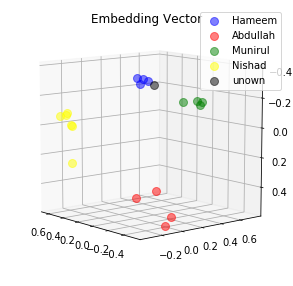

0.0609145313501358
0.11205925792455673
0.1054837703704834
0.14563147723674774
Average distance is  0.10602225922048092
end distance calcul
PREDICTION :  Hameem 
 percentange :  55.35357053981581
No of Faces Detected :  1
probability :  0.98266053
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49333787 -0.2007164  -0.34709206]]


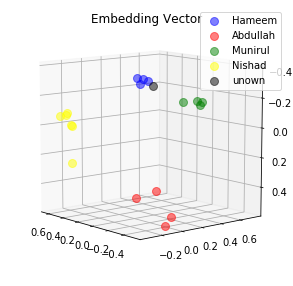

0.06579969078302383
0.11326112598180771
0.11007951200008392
0.14836594462394714
Average distance is  0.10937656834721565
end distance calcul
PREDICTION :  Hameem 
 percentange :  54.81169843034087
No of Faces Detected :  1
probability :  0.98209333
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49584508 -0.19906265 -0.3552628 ]]


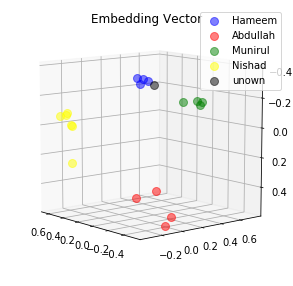

0.06348027288913727
0.11430814117193222
0.10807628184556961
0.14756108820438385
Average distance is  0.10835644602775574
end distance calcul
PREDICTION :  Hameem 
 percentange :  54.98274564077724
No of Faces Detected :  1
probability :  0.9814658
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5122773  -0.23912375 -0.31926534]]


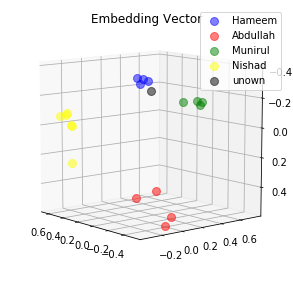

0.06617353856563568
0.09182851761579514
0.099758081138134
0.13662758469581604
Average distance is  0.09859693050384521
end distance calcul
PREDICTION :  Hameem 
 percentange :  55.48451433080861
No of Faces Detected :  1
probability :  0.98305416
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48330685 -0.2413904  -0.32918045]]


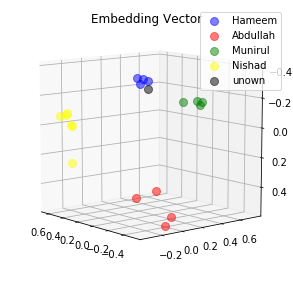

0.05537126213312149
0.07867893576622009
0.0899529978632927
0.1207597553730011
Average distance is  0.08619073778390884
end distance calcul
PREDICTION :  Hameem 
 percentange :  54.784353713734134
No of Faces Detected :  1
probability :  0.9829129
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.52052087 -0.21506397 -0.34964612]]


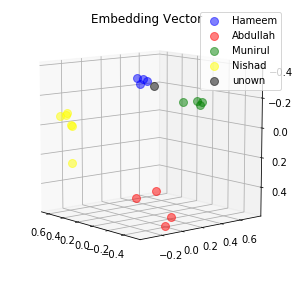

0.05791378766298294
0.10640519857406616
0.09947194904088974
0.14340005815029144
Average distance is  0.10179774835705757
end distance calcul
PREDICTION :  Hameem 
 percentange :  56.42278722240809
No of Faces Detected :  1
probability :  0.98237056
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5183814  -0.22036639 -0.3404872 ]]


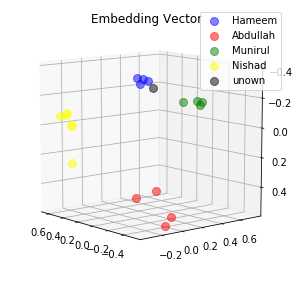

0.05905770882964134
0.102471262216568
0.0994889885187149
0.14192084968090057
Average distance is  0.1007347023114562
end distance calcul
PREDICTION :  Hameem 
 percentange :  56.100241962810884
No of Faces Detected :  1
probability :  0.9794642
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.51396173 -0.21220794 -0.35035938]]


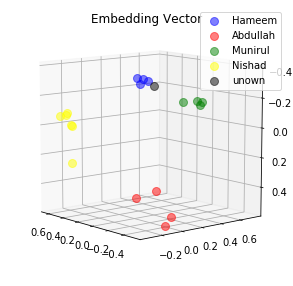

0.05725184455513954
0.10654492676258087
0.10012222826480865
0.1429985761642456
Average distance is  0.10172939393669367
end distance calcul
PREDICTION :  Hameem 
 percentange :  55.671166993556106
No of Faces Detected :  1
probability :  0.9784641
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.50220823 -0.23097734 -0.34392875]]


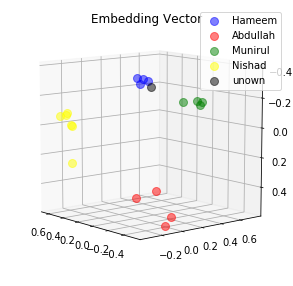

0.04565875604748726
0.08655111491680145
0.08653637766838074
0.1258639693260193
Average distance is  0.08615255448967218
end distance calcul
PREDICTION :  Hameem 
 percentange :  55.71977229726009
No of Faces Detected :  1
probability :  0.98099667
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5008727  -0.22234209 -0.3549589 ]]


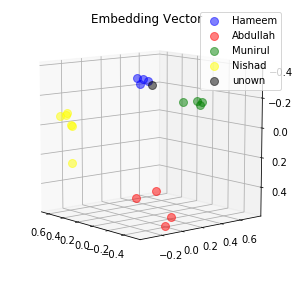

0.04365931451320648
0.09258435666561127
0.08746058493852615
0.12811237573623657
Average distance is  0.08795415796339512
end distance calcul
PREDICTION :  Hameem 
 percentange :  55.920722941662405
No of Faces Detected :  1
probability :  0.98374283
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49760348 -0.23697567 -0.31531647]]


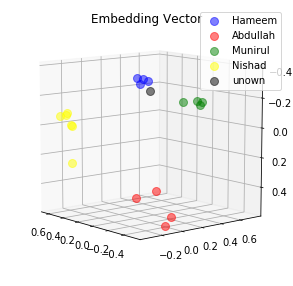

0.06851513683795929
0.09132001549005508
0.10278613120317459
0.13597233593463898
Average distance is  0.09964840486645699
end distance calcul
PREDICTION :  Hameem 
 percentange :  54.424446196962876
No of Faces Detected :  1
probability :  0.98510015
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5026547  -0.2292192  -0.29498184]]


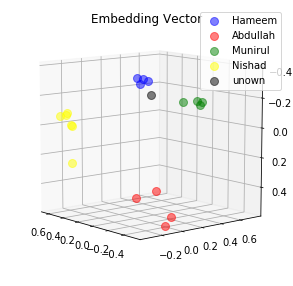

0.09048038721084595
0.110361747443676
0.12405171990394592
0.1563064455986023
Average distance is  0.12030007503926754
end distance calcul
PREDICTION :  Hameem 
 percentange :  53.29973850558075
No of Faces Detected :  1
probability :  0.98536825
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49372986 -0.23121162 -0.3341456 ]]


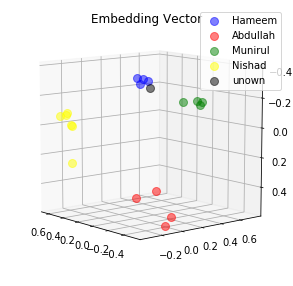

0.05340449512004852
0.08725415170192719
0.0925174355506897
0.12818275392055511
Average distance is  0.09033970907330513
end distance calcul
PREDICTION :  Hameem 
 percentange :  54.2985203738279
No of Faces Detected :  1
probability :  0.98492634
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.50163555 -0.21439946 -0.35102788]]


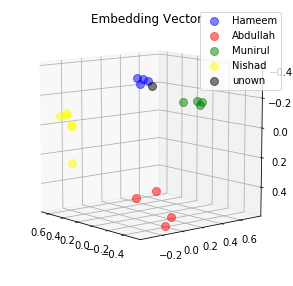

0.052435822784900665
0.10088120400905609
0.09634286165237427
0.13678565621376038
Average distance is  0.09661138616502285
end distance calcul
PREDICTION :  Hameem 
 percentange :  55.23918469058439
No of Faces Detected :  1
probability :  0.98136973
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49393865 -0.21560353 -0.35350353]]


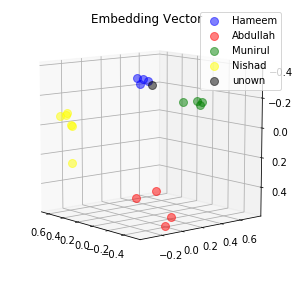

0.04976274445652962
0.09790891408920288
0.09390979260206223
0.13272155821323395
Average distance is  0.09357575234025717
end distance calcul
PREDICTION :  Hameem 
 percentange :  55.09377206236499
No of Faces Detected :  1
probability :  0.97715783
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48367077 -0.20642258 -0.35441923]]


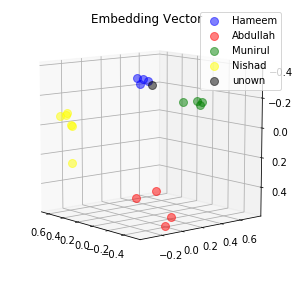

0.05847305804491043
0.10583630949258804
0.10237196087837219
0.13868457078933716
Average distance is  0.10134147480130196
end distance calcul
PREDICTION :  Hameem 
 percentange :  54.65834795320386
No of Faces Detected :  1
probability :  0.9534453
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.45642838 -0.2067784  -0.3149592 ]]


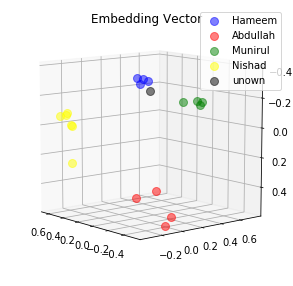

0.09177041053771973
0.11793512105941772
0.12946830689907074
0.15518733859062195
Average distance is  0.12359029427170753
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.94663497715882
No of Faces Detected :  1
probability :  0.93443346
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4756197  -0.2253279  -0.27763772]]


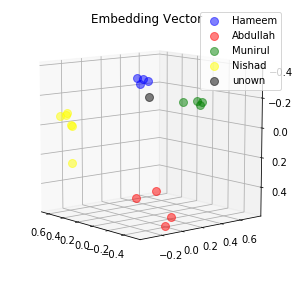

0.10980091243982315
0.12229488044977188
0.141921728849411
0.1668248474597931
Average distance is  0.13521059229969978
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.60009424790736
No of Faces Detected :  1
probability :  0.88245624
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47799927 -0.2188052  -0.28940302]]


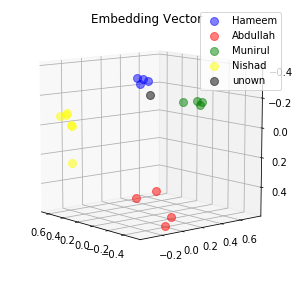

0.1006787046790123
0.11924394965171814
0.1355179399251938
0.1629563421010971
Average distance is  0.12959923408925533
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.26638864131975
No of Faces Detected :  0
No of cropped_faces :  0
No of Faces Detected :  1
probability :  0.99217606
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.41760686 -0.12424676 -0.23246433]]


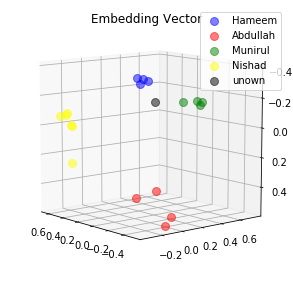

0.21396571397781372
0.23701143264770508
0.25236451625823975
0.2742631435394287
Average distance is  0.24440120160579681
end distance calcul
PREDICTION :  Hameem 
 percentange :  43.31605598145603
No of Faces Detected :  1
probability :  0.9972837
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.41354176 -0.11127008 -0.22667764]]


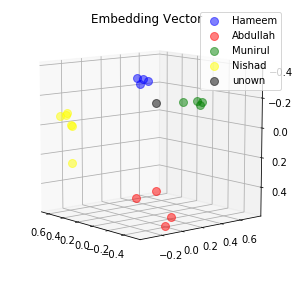

0.22760117053985596
0.2515467405319214
0.26640596985816956
0.28848904371261597
Average distance is  0.2585107311606407
end distance calcul
PREDICTION :  Hameem 
 percentange :  42.57015192698125
No of Faces Detected :  1
probability :  0.9954796
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4185678  -0.09820865 -0.24154074]]


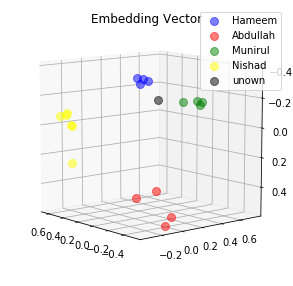

0.2249981015920639
0.25335344672203064
0.2652827799320221
0.2893857955932617
Average distance is  0.2582550309598446
end distance calcul
PREDICTION :  Hameem 
 percentange :  43.112607506782794
No of Faces Detected :  1
probability :  0.9667167
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.33500728 -0.090399   -0.32021362]]


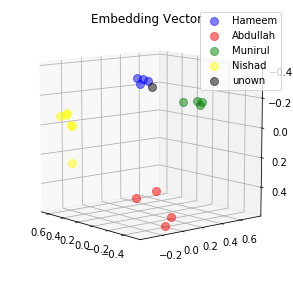

0.23946526646614075
0.26729825139045715
0.2738795876502991
0.28714045882225037
Average distance is  0.26694589108228683
end distance calcul
PREDICTION :  Hameem 
 percentange :  44.74757023019015
No of Faces Detected :  2
probability :  0.97956085
probability :  0.85450816
No of cropped_faces :  2
No of embeddings :  2
start distance cal
dude its happing for Hameem [[-0.44835752 -0.1506073  -0.28613633]]


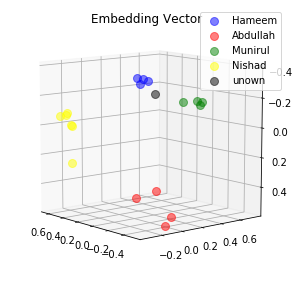

0.15021903812885284
0.18148404359817505
0.191076397895813
0.21825914084911346
Average distance is  0.1852596551179886
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.45448442132728
start distance cal
dude its happing for Abdullah [[0.0987126  0.00921707 0.25426522]]


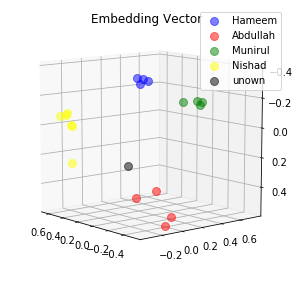

0.5028247833251953
0.6504339575767517
0.671530544757843
0.3127008378505707
Average distance is  0.5343725308775902
end distance calcul
PREDICTION :  unkown 
 percentange :  37.463438158155945
No of Faces Detected :  2
probability :  0.90091574
probability :  0.87818533
No of cropped_faces :  2
No of embeddings :  2
start distance cal
dude its happing for Hameem [[-0.35665205 -0.16475384 -0.2794845 ]]


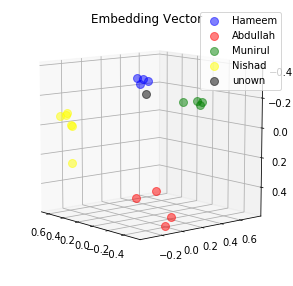

0.19535954296588898
0.20874878764152527
0.22602318227291107
0.23470552265644073
Average distance is  0.2162092588841915
end distance calcul
PREDICTION :  Hameem 
 percentange :  46.46827385167935
start distance cal
dude its happing for Abdullah [[ 0.02149058 -0.13736987  0.3223146 ]]


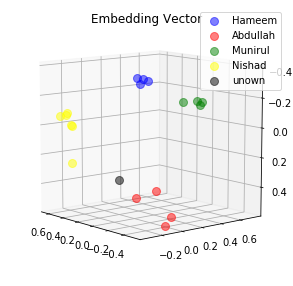

0.4112907648086548
0.551083505153656
0.5813151597976685
0.19875068962574005
Average distance is  0.4356100298464298
end distance calcul
PREDICTION :  Abdullah 
 percentange :  46.91069802330387
No of Faces Detected :  1
probability :  0.8666363
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Abdullah [[-0.05744695 -0.0415083   0.44560367]]


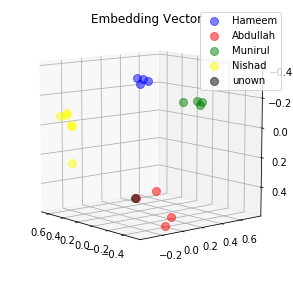

0.34575018286705017
0.42566123604774475
0.46693578362464905
0.09994355589151382
Average distance is  0.33457268960773945
end distance calcul
PREDICTION :  Abdullah 
 percentange :  50.57788179623387
No of Faces Detected :  1
probability :  0.8776556
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.41661528 -0.07662534  0.3898882 ]]


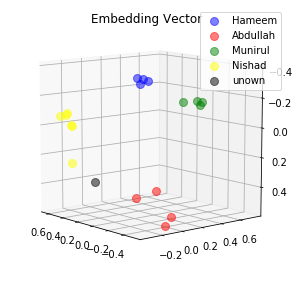

0.43707627058029175
0.5098183751106262
0.5289306640625
0.22680066525936127
0.5183568000793457
0.4260502755641937
Average distance is  0.44117217510938644
end distance calcul
PREDICTION :  Nishad 
 percentange :  54.83396353447449
No of Faces Detected :  1
probability :  0.91788524
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.49271265 -0.04245149  0.07829285]]


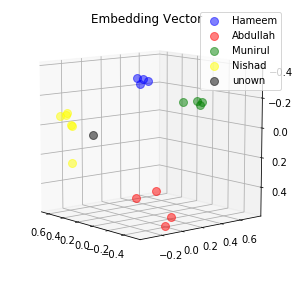

0.20754605531692505
0.25764012336730957
0.2989787459373474
0.2623921036720276
0.2605213522911072
0.17874017357826233
Average distance is  0.24430309236049652
end distance calcul
PREDICTION :  Nishad 
 percentange :  56.58976828196811
No of Faces Detected :  1
probability :  0.9086242
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.43450546 -0.14638229 -0.02609524]]


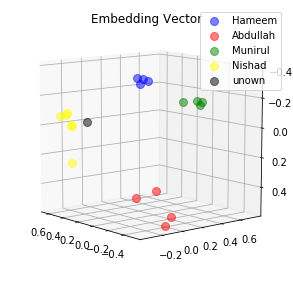

0.13749562203884125
0.19124063849449158
0.22954778373241425
0.3099881410598755
0.18393579125404358
0.1725791096687317
Average distance is  0.20413118104139963
end distance calcul
PREDICTION :  Nishad 
 percentange :  57.44851101176916
No of Faces Detected :  0
No of cropped_faces :  0
No of Faces Detected :  1
probability :  0.90267515
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[0.23212987 0.01711664 0.21141787]]


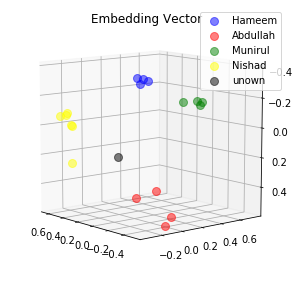

0.44841718673706055
0.5215575695037842
0.5555871725082397
0.383282333612442
0.5207887887954712
0.4566670060157776
Average distance is  0.4810500095287959
end distance calcul
PREDICTION :  unkown 
 percentange :  38.90652453199274
No of Faces Detected :  1
probability :  0.945402
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.20010221 -0.02168526  0.21155083]]


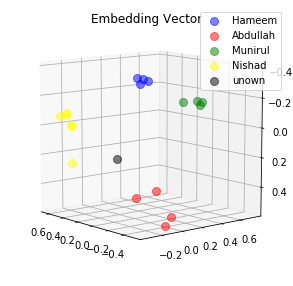

0.4522169828414917
0.5283678770065308
0.5597226023674011
0.3856864869594574
0.5269554257392883
0.46903106570243835
Average distance is  0.48699674010276794
end distance calcul
PREDICTION :  unkown 
 percentange :  38.285124556562366
No of Faces Detected :  1
probability :  0.96175194
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.22430982 -0.04933874  0.23031922]]


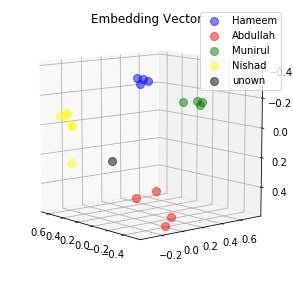

0.4314975142478943
0.5098739862442017
0.5389565825462341
0.34869861602783203
0.5095332860946655
0.44870367646217346
Average distance is  0.4645439436038335
end distance calcul
PREDICTION :  unkown 
 percentange :  40.83307717964326
No of Faces Detected :  0
No of cropped_faces :  0
No of Faces Detected :  1
probability :  0.93251836
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[0.21376415 0.00030095 0.15892452]]


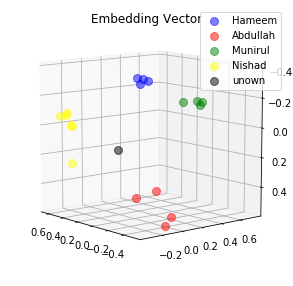

0.4305267930030823
0.5023044347763062
0.5370854139328003
0.39703524112701416
0.4995853900909424
0.4457150101661682
Average distance is  0.46870871384938556
end distance calcul
PREDICTION :  unkown 
 percentange :  39.06602741554759
No of Faces Detected :  1
probability :  0.9404931
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.26331136 -0.04964973  0.17283127]]


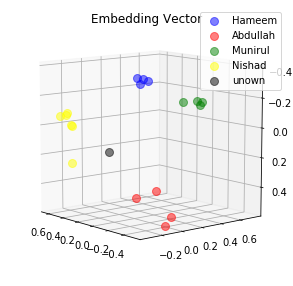

0.3736054599285126
0.4493085443973541
0.4811069965362549
0.32636672258377075
0.44808074831962585
0.3902573585510254
Average distance is  0.41145430505275726
end distance calcul
PREDICTION :  unkown 
 percentange :  44.461928571902554
No of Faces Detected :  1
probability :  0.9599569
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.284077   -0.03820702  0.11710195]]


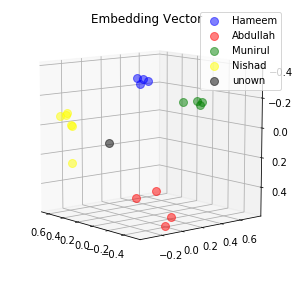

0.34122931957244873
0.4119918644428253
0.44736963510513306
0.3365578055381775
0.4092575013637543
0.35700079798698425
Average distance is  0.38390115400155383
end distance calcul
PREDICTION :  unkown 
 percentange :  46.61232886744292
No of Faces Detected :  1
probability :  0.96728396
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.29106233 -0.08611877  0.15797135]]


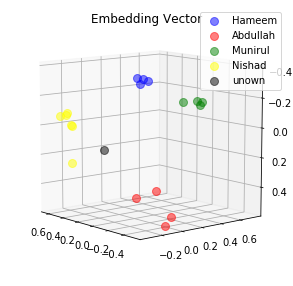

0.3290403187274933
0.406524658203125
0.4365306496620178
0.289739191532135
0.4054942727088928
0.3498653173446655
Average distance is  0.36953240136305493
end distance calcul
PREDICTION :  unkown 
 percentange :  48.917945861734516
No of Faces Detected :  1
probability :  0.9424864
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.30889314 -0.06420279  0.16087462]]


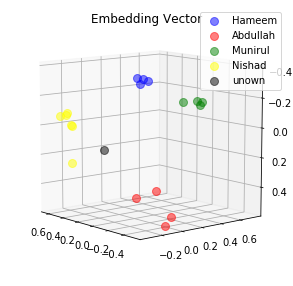

0.32750558853149414
0.40314897894859314
0.4350213408470154
0.2868278920650482
0.4026932120323181
0.3417476713657379
Average distance is  0.3661574472983678
end distance calcul
PREDICTION :  unkown 
 percentange :  48.42017713675708
No of Faces Detected :  1
probability :  0.9578657
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Abdullah [[ 0.17000866 -0.07665537  0.21258542]]


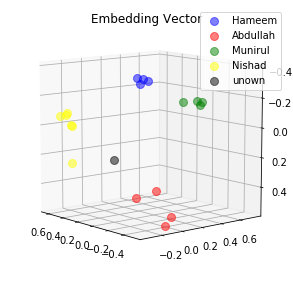

0.5721891522407532
0.7291592955589294
0.75244140625
0.3783668875694275
Average distance is  0.6080391854047775
end distance calcul
PREDICTION :  unkown 
 percentange :  38.182582047548735
No of Faces Detected :  1
probability :  0.98176444
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.30981794 -0.06308802  0.15586908]]


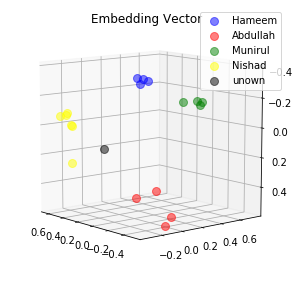

0.324970543384552
0.400227427482605
0.4324476718902588
0.288552463054657
0.39961227774620056
0.33923792839050293
Average distance is  0.3641747186581294
end distance calcul
PREDICTION :  unkown 
 percentange :  47.636307089988335
No of Faces Detected :  1
probability :  0.99060744
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.28443947 -0.06404754  0.18517663]]


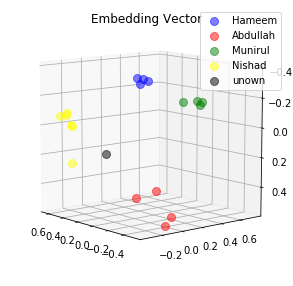

0.35741785168647766
0.4345603883266449
0.46500152349472046
0.2984837591648102
0.43429136276245117
0.3731182813644409
Average distance is  0.3938121944665909
end distance calcul
PREDICTION :  unkown 
 percentange :  44.841050398707
No of Faces Detected :  1
probability :  0.9937588
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.32186303 -0.05859349  0.16564249]]


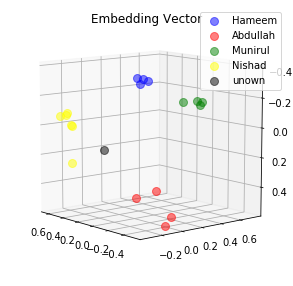

0.3237408697605133
0.39885085821151733
0.4310811460018158
0.2791191041469574
0.39893215894699097
0.334742933511734
Average distance is  0.36107784509658813
end distance calcul
PREDICTION :  unkown 
 percentange :  48.660551098111384
No of Faces Detected :  1
probability :  0.9950117
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.26436576 -0.05596351  0.16700393]]


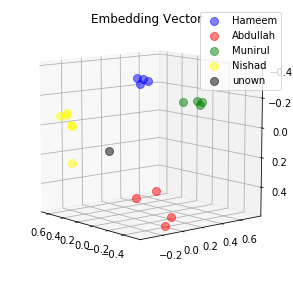

0.36714601516723633
0.4430029094219208
0.47460874915122986
0.3236965537071228
0.4416041970252991
0.38510656356811523
Average distance is  0.405860831340154
end distance calcul
PREDICTION :  unkown 
 percentange :  42.88879455055276
No of Faces Detected :  1
probability :  0.9952197
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.28707024 -0.05180493  0.1750291 ]]


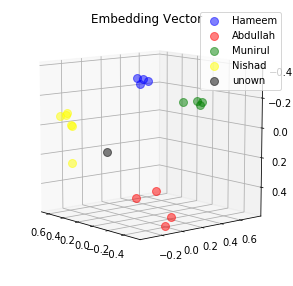

0.35622864961624146
0.43190997838974
0.46376416087150574
0.3060733377933502
0.43135109543800354
0.3702051341533661
Average distance is  0.39325539271036786
end distance calcul
PREDICTION :  unkown 
 percentange :  44.86323466155097
No of Faces Detected :  1
probability :  0.9959158
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.24880956 -0.03847821  0.18435597]]


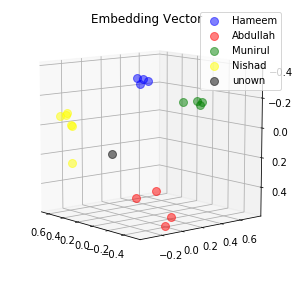

0.39511388540267944
0.4707270562648773
0.5026288628578186
0.3413083553314209
0.46953481435775757
0.4109070301055908
Average distance is  0.4317033340533574
end distance calcul
PREDICTION :  unkown 
 percentange :  39.99860506558781
No of Faces Detected :  1
probability :  0.9961935
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.26090318 -0.03132545  0.18789655]]


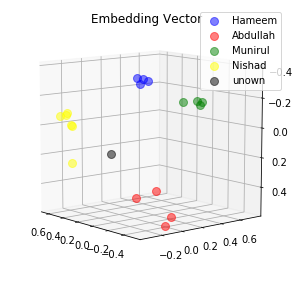

0.39147189259529114
0.4665776193141937
0.4989664852619171
0.33514657616615295
0.46577662229537964
0.4045540392398834
Average distance is  0.42708220581213635
end distance calcul
PREDICTION :  unkown 
 percentange :  41.45951891796486
No of Faces Detected :  1
probability :  0.9958134
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.26288953 -0.0132643   0.18890865]]


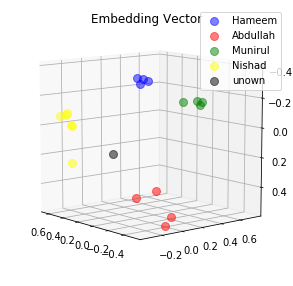

0.3999377191066742
0.4736667573451996
0.5072066783905029
0.34446120262145996
0.4729318916797638
0.409971684217453
Average distance is  0.4346959888935089
end distance calcul
PREDICTION :  unkown 
 percentange :  40.30046917663095
No of Faces Detected :  1
probability :  0.9962839
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.23215628 -0.02703209  0.17975159]]


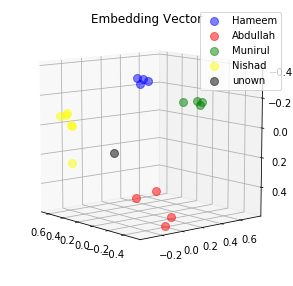

0.41103672981262207
0.48576533794403076
0.5183839201927185
0.3620327115058899
0.484056681394577
0.42717063426971436
Average distance is  0.4480743358532588
end distance calcul
PREDICTION :  unkown 
 percentange :  38.32241266121218
No of Faces Detected :  1
probability :  0.9960066
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.267527   -0.02316792  0.18623267]]


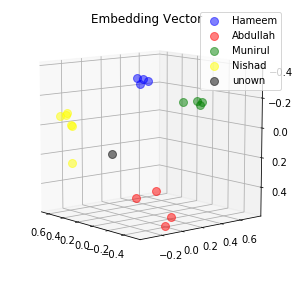

0.39015376567840576
0.4644378423690796
0.4975203275680542
0.3353652358055115
0.4637356102466583
0.4012693464756012
Average distance is  0.4254136880238851
end distance calcul
PREDICTION :  unkown 
 percentange :  41.494802082907626
No of Faces Detected :  1
probability :  0.9952177
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.31210926 -0.05058398  0.20825464]]


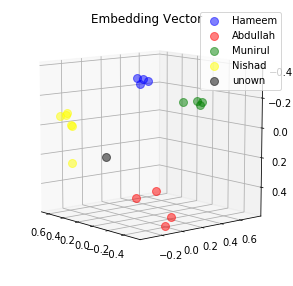

0.3576997220516205
0.4340953230857849
0.46468207240104675
0.28019970655441284
0.435313880443573
0.3659483790397644
Average distance is  0.38965651392936707
end distance calcul
PREDICTION :  unkown 
 percentange :  46.68282357408622
No of Faces Detected :  1
probability :  0.99575037
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.23881243 -0.04894461  0.17371508]]


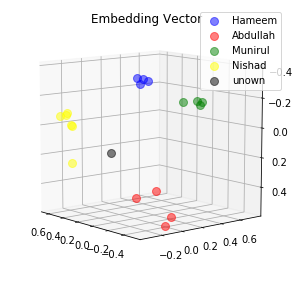

0.3929402530193329
0.4688204824924469
0.5002965331077576
0.34619200229644775
0.46706029772758484
0.4121014475822449
Average distance is  0.4312351693709691
end distance calcul
PREDICTION :  unkown 
 percentange :  39.99807112513005
No of Faces Detected :  1
probability :  0.99594533
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[0.28830582 0.00835376 0.20444992]]


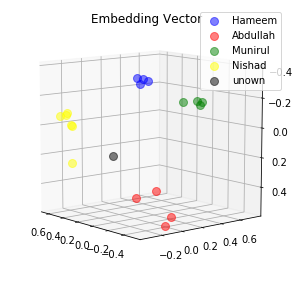

0.4028410315513611
0.4748876392841339
0.5093474388122559
0.33772674202919006
0.4752204418182373
0.4056077301502228
Average distance is  0.4342718372742335
end distance calcul
PREDICTION :  unkown 
 percentange :  42.04571864331812
No of Faces Detected :  1
probability :  0.99522996
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.29450163 -0.01308319  0.21596077]]


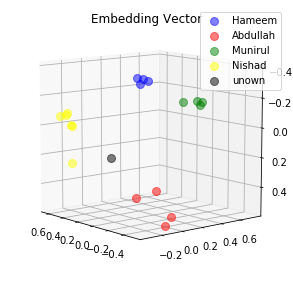

0.39287295937538147
0.46698233485221863
0.4996534585952759
0.3167266547679901
0.46786171197891235
0.3973287045955658
Average distance is  0.42357097069422406
end distance calcul
PREDICTION :  unkown 
 percentange :  42.243552608344935
No of Faces Detected :  1
probability :  0.9947543
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[0.32649335 0.00190042 0.21499395]]


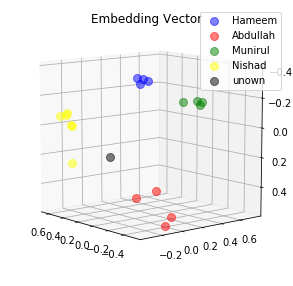

0.38180631399154663
0.45338761806488037
0.4872792065143585
0.3060259222984314
0.45505914092063904
0.37944096326828003
Average distance is  0.41049986084302265
end distance calcul
PREDICTION :  unkown 
 percentange :  44.87146855554763
No of Faces Detected :  1
probability :  0.9953368
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.2554744  -0.02208625  0.16478147]]


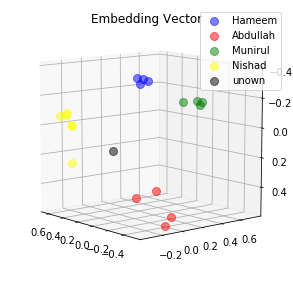

0.3897179663181305
0.4629542827606201
0.49684447050094604
0.3504027724266052
0.46127283573150635
0.4033561646938324
Average distance is  0.42742474873860675
end distance calcul
PREDICTION :  unkown 
 percentange :  40.29961254575584
No of Faces Detected :  1
probability :  0.99524546
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.2742039  -0.03475158  0.18008575]]


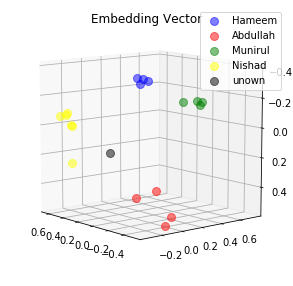

0.3764687776565552
0.45124348998069763
0.48391032218933105
0.32466763257980347
0.45051315426826477
0.38893747329711914
Average distance is  0.4126234749952952
end distance calcul
PREDICTION :  unkown 
 percentange :  42.55212197879171
No of Faces Detected :  1
probability :  0.99480534
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.24112618 -0.03206673  0.1753276 ]]


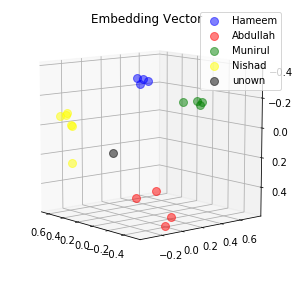

0.3998718559741974
0.4746347665786743
0.50722736120224
0.35308846831321716
0.4729784429073334
0.4160645604133606
Average distance is  0.4373109092315038
end distance calcul
PREDICTION :  unkown 
 percentange :  39.68836942998244
No of Faces Detected :  1
probability :  0.99414384
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.2953146  -0.02946529  0.18320885]]


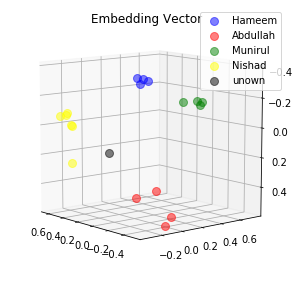

0.36615657806396484
0.44020530581474304
0.4733513593673706
0.31150662899017334
0.4401097893714905
0.3748142421245575
Average distance is  0.4010239839553833
end distance calcul
PREDICTION :  unkown 
 percentange :  44.450233672548286
No of Faces Detected :  1
probability :  0.99443614
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.25582165 -0.05622017  0.21257354]]


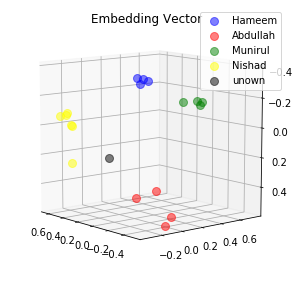

0.39606261253356934
0.4740196466445923
0.5035785436630249
0.3206116855144501
0.47389519214630127
0.4120483100414276
Average distance is  0.43003599842389423
end distance calcul
PREDICTION :  unkown 
 percentange :  42.80174287481867
No of Faces Detected :  1
probability :  0.9949739
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.2694809  -0.0704613   0.19820441]]


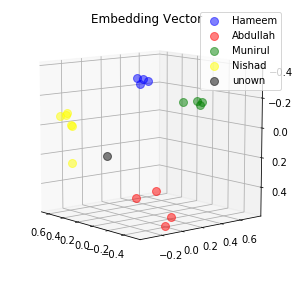

0.3723236918449402
0.4505959451198578
0.47982409596443176
0.30420419573783875
0.450377881526947
0.3899667263031006
Average distance is  0.40788208941618603
end distance calcul
PREDICTION :  unkown 
 percentange :  43.58732039831417
No of Faces Detected :  1
probability :  0.99439085
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.28390515 -0.05221088  0.20185184]]


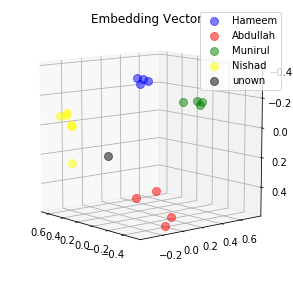

0.3721741735935211
0.4490925073623657
0.4796496331691742
0.30201464891433716
0.44933751225471497
0.38487929105758667
Average distance is  0.40619129439194995
end distance calcul
PREDICTION :  unkown 
 percentange :  44.681897824895984
No of Faces Detected :  1
probability :  0.9938189
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.29641545 -0.03546138  0.19008619]]


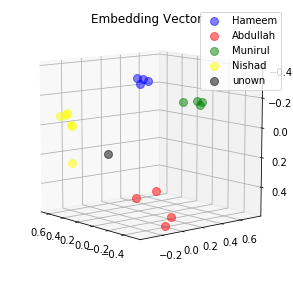

0.3657277822494507
0.4405768811702728
0.4729980528354645
0.3052349090576172
0.4407453238964081
0.37480002641677856
Average distance is  0.40001382927099866
end distance calcul
PREDICTION :  unkown 
 percentange :  44.90061593683902
No of Faces Detected :  1
probability :  0.9944056
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.32191154 -0.04872388  0.20397712]]


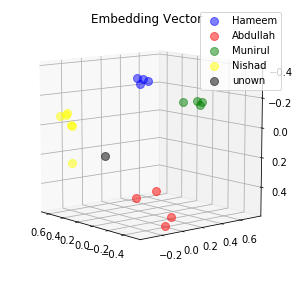

0.349902868270874
0.42571738362312317
0.4567202627658844
0.27502548694610596
0.4270791709423065
0.3566743731498718
Average distance is  0.38185325761636096
end distance calcul
PREDICTION :  unkown 
 percentange :  47.39717579783452
No of Faces Detected :  1
probability :  0.99426347
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.31659186 -0.04811063  0.18065713]]


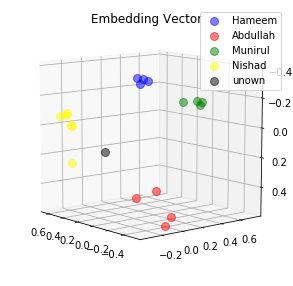

0.3406361937522888
0.41564229130744934
0.44783449172973633
0.28486013412475586
0.4160779118537903
0.34954389929771423
Average distance is  0.3757658203442891
end distance calcul
PREDICTION :  unkown 
 percentange :  47.153353711513034
No of Faces Detected :  1
probability :  0.99452287
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.31370318 -0.039051    0.19595662]]


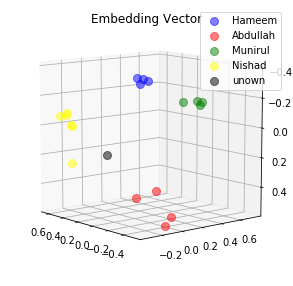

0.3556147813796997
0.4305518567562103
0.46260160207748413
0.2890215516090393
0.4313933849334717
0.3624756932258606
Average distance is  0.3886098116636276
end distance calcul
PREDICTION :  unkown 
 percentange :  46.77430383796141
No of Faces Detected :  1
probability :  0.9945404
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.34774393 -0.07968954  0.16528447]]


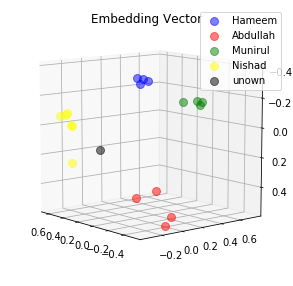

0.29538869857788086
0.3717891573905945
0.4025936424732208
0.24807927012443542
0.3727094531059265
0.306431382894516
Average distance is  0.332831934094429
end distance calcul
PREDICTION :  Nishad 
 percentange :  50.83886376738249
No of Faces Detected :  1
probability :  0.99440503
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.33857137 -0.07544403  0.1756899 ]]


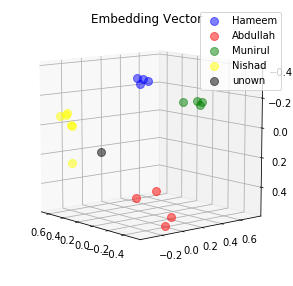

0.3094179630279541
0.38609474897384644
0.4166039526462555
0.25347334146499634
0.3870866298675537
0.3203088641166687
Average distance is  0.3454975833495458
end distance calcul
PREDICTION :  unkown 
 percentange :  50.08400899229226
No of Faces Detected :  1
probability :  0.994563
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.34354055 -0.0617104   0.1806892 ]]


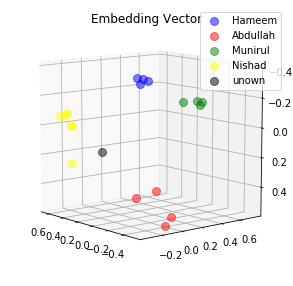

0.3160798251628876
0.3915141522884369
0.42290952801704407
0.25706160068511963
0.3928001821041107
0.3232324719429016
Average distance is  0.35059962670008343
end distance calcul
PREDICTION :  unkown 
 percentange :  50.312904276003
No of Faces Detected :  1
probability :  0.99468255
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.30122066 -0.03489418  0.18165904]]


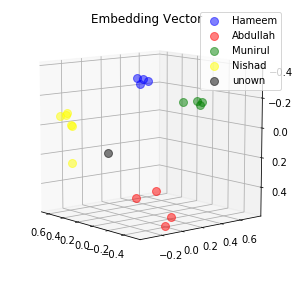

0.35846462845802307
0.4327571988105774
0.46567514538764954
0.304129958152771
0.43277546763420105
0.36728164553642273
Average distance is  0.3935140073299408
end distance calcul
PREDICTION :  unkown 
 percentange :  46.61105757081415
No of Faces Detected :  1
probability :  0.99522096
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.3311987  -0.06389157  0.17491141]]


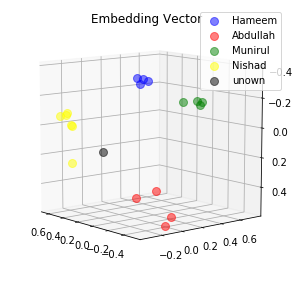

0.3196565806865692
0.3954424560070038
0.4268713891506195
0.26614096760749817
0.3961464762687683
0.32957443594932556
Average distance is  0.35563871761163074
end distance calcul
PREDICTION :  unkown 
 percentange :  49.11857394317647
No of Faces Detected :  1
probability :  0.99523544
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.34528774 -0.07495537  0.17351294]]


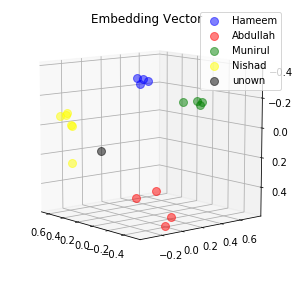

0.30403515696525574
0.38038915395736694
0.41111356019973755
0.24972623586654663
0.3815173804759979
0.31391963362693787
Average distance is  0.3401168535153071
end distance calcul
PREDICTION :  unkown 
 percentange :  50.52538409561318
No of Faces Detected :  1
probability :  0.99524295
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.32775906 -0.05963773  0.20589237]]


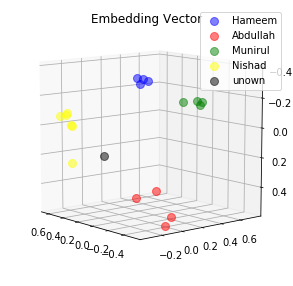

0.341881662607193
0.4185017943382263
0.44861045479774475
0.2632412612438202
0.4201323688030243
0.34950071573257446
Average distance is  0.37364470958709717
end distance calcul
PREDICTION :  unkown 
 percentange :  48.58380094717355
No of Faces Detected :  1
probability :  0.9957629
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.33019438 -0.06695959  0.18001029]]


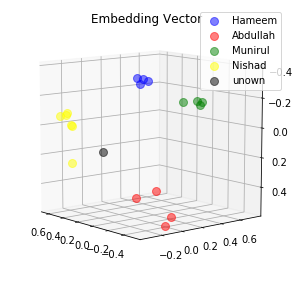

0.32159239053726196
0.39789459109306335
0.42879804968833923
0.2633747160434723
0.3987550735473633
0.33187398314476013
Average distance is  0.3570481340090434
end distance calcul
PREDICTION :  unkown 
 percentange :  48.971277782427066
No of Faces Detected :  1
probability :  0.9960543
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.3505131  -0.03559235  0.19045016]]


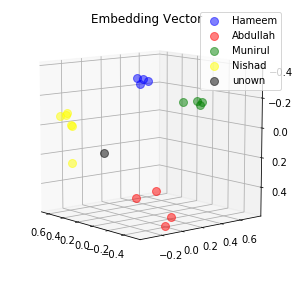

0.3319430649280548
0.4049500524997711
0.43782564997673035
0.2677380442619324
0.40669721364974976
0.3326985538005829
Average distance is  0.3636420965194702
end distance calcul
PREDICTION :  unkown 
 percentange :  48.99390390846583
No of Faces Detected :  1
probability :  0.9956566
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.37720963 -0.05180353  0.16551322]]


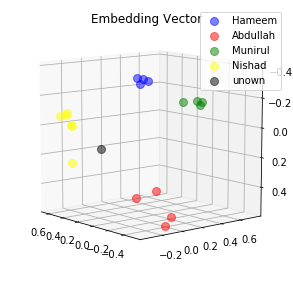

0.2929040193557739
0.36515480279922485
0.3984817564487457
0.24761879444122314
0.3669849932193756
0.2931209206581116
Average distance is  0.3273775478204091
end distance calcul
PREDICTION :  Nishad 
 percentange :  51.002110055499074
No of Faces Detected :  1
probability :  0.99501574
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.31722108 -0.04941214  0.1716689 ]]


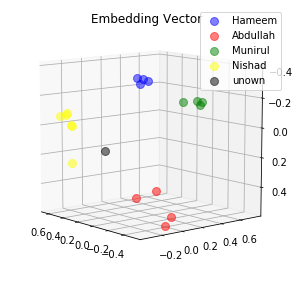

0.3348255455493927
0.40951013565063477
0.4420701265335083
0.28620895743370056
0.4096551239490509
0.3444500267505646
Average distance is  0.37111998597780865
end distance calcul
PREDICTION :  unkown 
 percentange :  46.7997449443104
No of Faces Detected :  1
probability :  0.9948486
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.31475314 -0.03196357  0.15057649]]


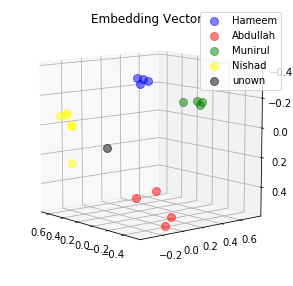

0.33607378602027893
0.4079883396625519
0.44282102584838867
0.3060849905014038
0.4072866141796112
0.3443174660205841
Average distance is  0.3740953703721364
end distance calcul
PREDICTION :  unkown 
 percentange :  46.76252339200334
No of Faces Detected :  1
probability :  0.9957384
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.3035271  -0.0473965   0.21377255]]


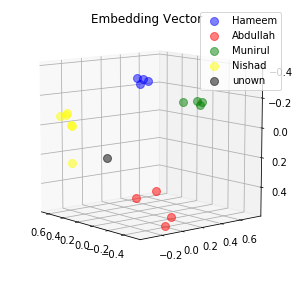

0.36802974343299866
0.444570928812027
0.4750679135322571
0.28773459792137146
0.44571101665496826
0.37663009762763977
Average distance is  0.3996240496635437
end distance calcul
PREDICTION :  unkown 
 percentange :  45.77516207788022
No of Faces Detected :  1
probability :  0.9959439
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.30741468 -0.01715275  0.19057064]]


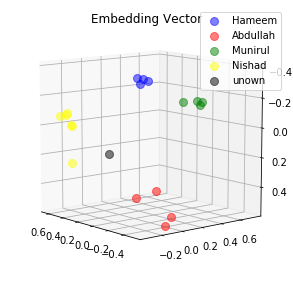

0.36884021759033203
0.4418150782585144
0.47555965185165405
0.3094180226325989
0.4422605335712433
0.37340208888053894
Average distance is  0.4018825987974803
end distance calcul
PREDICTION :  unkown 
 percentange :  45.48478813938884
No of Faces Detected :  1
probability :  0.99599874
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.27821594 -0.04410001  0.1894448 ]]


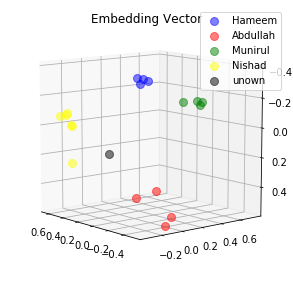

0.37354496121406555
0.44943058490753174
0.4810776710510254
0.31381574273109436
0.4491167664527893
0.3864403963088989
Average distance is  0.40890435377756756
end distance calcul
PREDICTION :  unkown 
 percentange :  44.34729058401301
No of Faces Detected :  1
probability :  0.99604154
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.3031734  -0.03412948  0.1939291 ]]


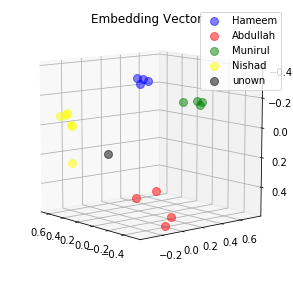

0.3639715015888214
0.43870145082473755
0.4710994362831116
0.30029672384262085
0.43917423486709595
0.37166157364845276
Average distance is  0.39748415350914
end distance calcul
PREDICTION :  unkown 
 percentange :  45.75576923934254
No of Faces Detected :  1
probability :  0.9960373
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.27303803 -0.08407147  0.18376935]]


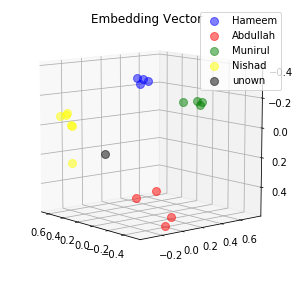

0.3564656376838684
0.4350737929344177
0.463891863822937
0.29763051867485046
0.43448400497436523
0.3770153224468231
Average distance is  0.394093523422877
end distance calcul
PREDICTION :  unkown 
 percentange :  45.17105102526639
No of Faces Detected :  1
probability :  0.99638975
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.34460297 -0.04930659  0.23101564]]


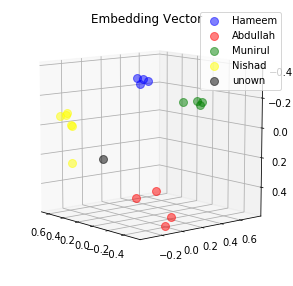

0.3528878092765808
0.4286356568336487
0.4582686424255371
0.25422191619873047
0.43150967359542847
0.3547113239765167
Average distance is  0.38003917038440704
end distance calcul
PREDICTION :  unkown 
 percentange :  49.52408454667764
No of Faces Detected :  1
probability :  0.9965742
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.27872363 -0.03679857  0.23727134]]


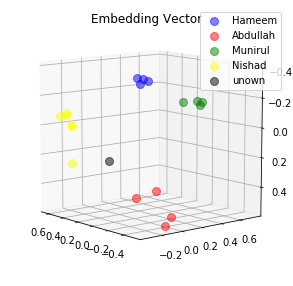

0.4030612111091614
0.48008546233177185
0.510099470615387
0.31077900528907776
0.4812329113483429
0.41194602847099304
Average distance is  0.4328673481941223
end distance calcul
PREDICTION :  unkown 
 percentange :  42.56429788866629
No of Faces Detected :  1
probability :  0.99469185
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.3219395  -0.01884553  0.19499654]]


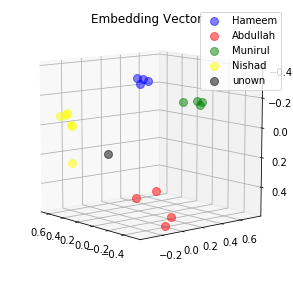

0.3611578643321991
0.43397170305252075
0.46752744913101196
0.29737868905067444
0.4349638521671295
0.3635731339454651
Average distance is  0.3930954486131668
end distance calcul
PREDICTION :  unkown 
 percentange :  45.79162346241413
No of Faces Detected :  1
probability :  0.9821344
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.30849886 -0.00623085  0.18829066]]


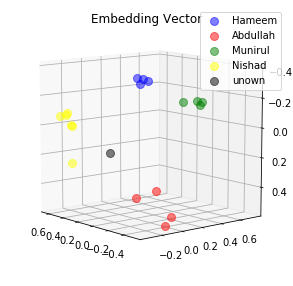

0.37335604429244995
0.44520464539527893
0.479765385389328
0.316806823015213
0.4455845355987549
0.3761819899082184
Average distance is  0.4061499039332072
end distance calcul
PREDICTION :  unkown 
 percentange :  44.65881909535144
No of Faces Detected :  1
probability :  0.9235114
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.3803463 -0.0389731  0.1432045]]


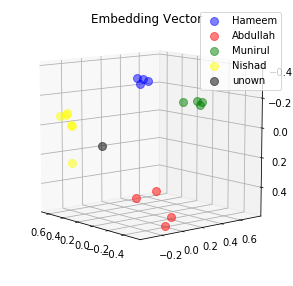

0.2873102128505707
0.35659849643707275
0.39229926466941833
0.2642991244792938
0.3576493263244629
0.2857646644115448
Average distance is  0.32398684819539386
end distance calcul
PREDICTION :  Nishad 
 percentange :  52.42296877082854
No of Faces Detected :  1
probability :  0.9749832
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.27170363 -0.06345658  0.17168185]]


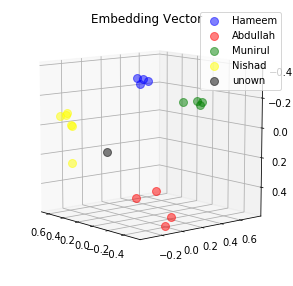

0.36033308506011963
0.4369339346885681
0.46787816286087036
0.3125203847885132
0.4358784854412079
0.3783941864967346
Average distance is  0.39865637322266895
end distance calcul
PREDICTION :  unkown 
 percentange :  44.605295309273565
No of Faces Detected :  1
probability :  0.9786235
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.27152088 -0.02932022  0.16484317]]


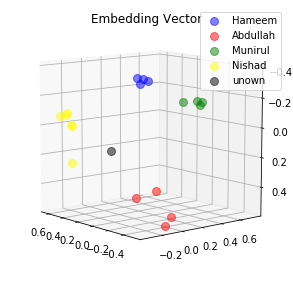

0.37420743703842163
0.4477645754814148
0.4814305007457733
0.33398640155792236
0.446457177400589
0.387054443359375
Average distance is  0.4118167559305827
end distance calcul
PREDICTION :  unkown 
 percentange :  44.07155142124496
No of Faces Detected :  1
probability :  0.97824186
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.25663653 -0.06392384  0.17506614]]


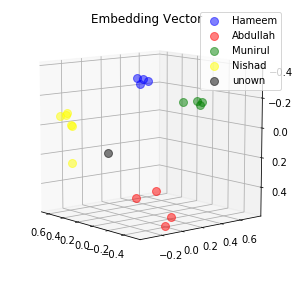

0.3731476068496704
0.45004552602767944
0.4806201159954071
0.32353144884109497
0.4487400949001312
0.39274218678474426
Average distance is  0.4114711632331212
end distance calcul
PREDICTION :  unkown 
 percentange :  43.715495506524185
No of Faces Detected :  1
probability :  0.95521367
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.28519413 -0.01952677  0.19501962]]


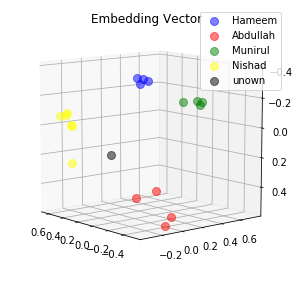

0.3843071460723877
0.458330899477005
0.49146896600723267
0.3226926326751709
0.45834025740623474
0.39209872484207153
Average distance is  0.4178731044133504
end distance calcul
PREDICTION :  unkown 
 percentange :  46.44182666521984
No of Faces Detected :  1
probability :  0.97648066
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.42553192 -0.03927064  0.20307069]]


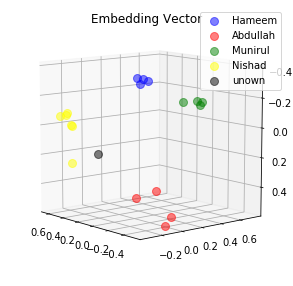

0.30106380581855774
0.36979925632476807
0.40171539783477783
0.22071488201618195
0.37454670667648315
0.287205308675766
Average distance is  0.32584089289108914
end distance calcul
PREDICTION :  Nishad 
 percentange :  55.83043361290881
No of Faces Detected :  1
probability :  0.99131644
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[0.356022   0.02731589 0.184353  ]]


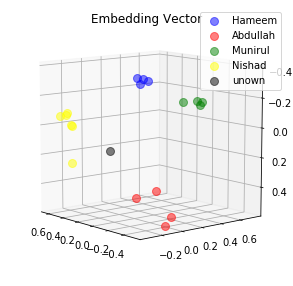

0.36603498458862305
0.4320945143699646
0.4692590832710266
0.31485864520072937
0.4335792660713196
0.35639598965644836
Average distance is  0.39537041385968524
end distance calcul
PREDICTION :  unkown 
 percentange :  48.39992252531326
No of Faces Detected :  1
probability :  0.97565794
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[0.25162327 0.01950126 0.19277082]]


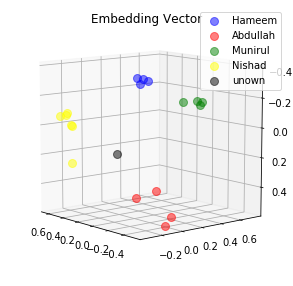

0.4277768135070801
0.49938997626304626
0.5345486402511597
0.37329164147377014
0.4984979033470154
0.43429049849510193
Average distance is  0.46129924555619556
end distance calcul
PREDICTION :  unkown 
 percentange :  42.16048533697555
No of Faces Detected :  1
probability :  0.9477868
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[0.35424364 0.20827068 0.19900331]]


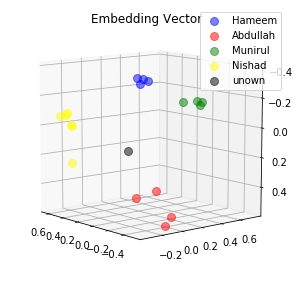

0.5151954889297485
0.5665475130081177
0.6094943881034851
0.47288480401039124
0.5678030252456665
0.48773065209388733
Average distance is  0.5366093118985494
end distance calcul
PREDICTION :  unkown 
 percentange :  40.559075118387014
No of Faces Detected :  1
probability :  0.9576336
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[0.34137997 0.08020287 0.2935674 ]]


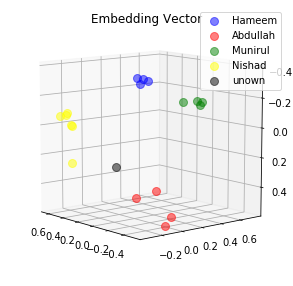

0.47089695930480957
0.5378628373146057
0.5721756815910339
0.36014458537101746
0.5415979027748108
0.4546383321285248
Average distance is  0.4895527164141337
end distance calcul
PREDICTION :  unkown 
 percentange :  45.953737228330894
No of Faces Detected :  1
probability :  0.9534733
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.324824   -0.09257776  0.40884826]]


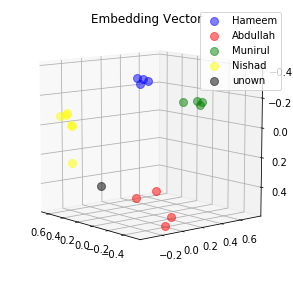

0.482793927192688
0.5615149736404419
0.5802651643753052
0.2823251783847809
0.5679011940956116
0.4850189983844757
Average distance is  0.49330323934555054
end distance calcul
PREDICTION :  unkown 
 percentange :  49.505122917925284
No of Faces Detected :  1
probability :  0.9543371
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.3114751  -0.02541637  0.37779897]]


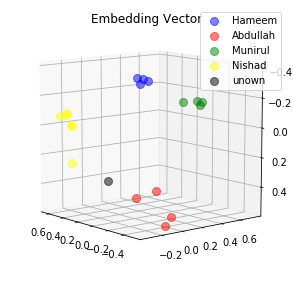

0.4871547222137451
0.5637854337692261
0.5884940028190613
0.31590089201927185
0.569006085395813
0.4843311011791229
Average distance is  0.5014453728993734
end distance calcul
PREDICTION :  unkown 
 percentange :  46.49005152260211
No of Faces Detected :  1
probability :  0.97466624
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Nishad [[ 0.26786503 -0.04031351  0.2035529 ]]


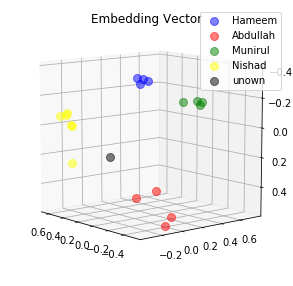

0.3899625241756439
0.4663201570510864
0.49749842286109924
0.32133913040161133
0.46619150042533875
0.40266644954681396
Average distance is  0.42399636407693225
end distance calcul
PREDICTION :  unkown 
 percentange :  42.12072207147416
No of Faces Detected :  2
probability :  0.96222335
probability :  0.9615251
No of cropped_faces :  2
No of embeddings :  2
start distance cal
dude its happing for Hameem [[-0.35752368 -0.26174837 -0.19940892]]


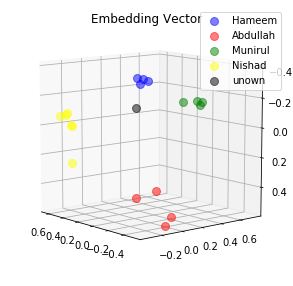

0.22809749841690063
0.21036037802696228
0.24422423541545868
0.2400161474943161
Average distance is  0.23067456483840942
end distance calcul
PREDICTION :  Hameem 
 percentange :  43.966457617075505
start distance cal
dude its happing for Abdullah [[ 0.01558954 -0.02851241  0.16894676]]


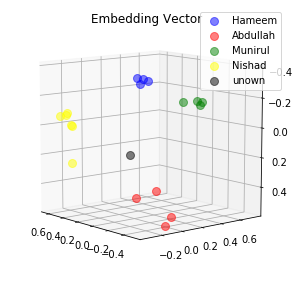

0.44335150718688965
0.6283477544784546
0.6354464888572693
0.30864620208740234
Average distance is  0.503947988152504
end distance calcul
PREDICTION :  unkown 
 percentange :  38.90553218634681
No of Faces Detected :  2
probability :  0.929715
probability :  0.8968077
No of cropped_faces :  2
No of embeddings :  2
start distance cal
dude its happing for Hameem [[-0.3978371  -0.12309864 -0.18433899]]


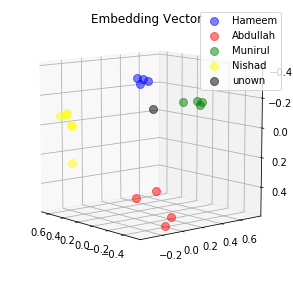

0.25721535086631775
0.27275463938713074
0.2928631901741028
0.3107655346393585
Average distance is  0.28339967876672745
end distance calcul
PREDICTION :  Hameem 
 percentange :  41.75754843555149
start distance cal
dude its happing for Abdullah [[-0.001489   -0.12968901  0.2938656 ]]


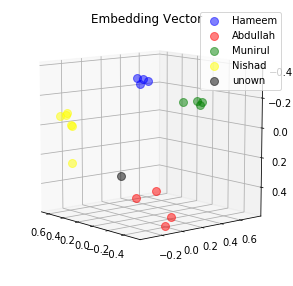

0.39051395654678345
0.5441702604293823
0.5689473748207092
0.196645125746727
Average distance is  0.4250691793859005
end distance calcul
PREDICTION :  Abdullah 
 percentange :  45.2376584104831
No of Faces Detected :  0
No of cropped_faces :  0
No of Faces Detected :  1
probability :  0.9875434
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48417628 -0.18412691 -0.17179365]]


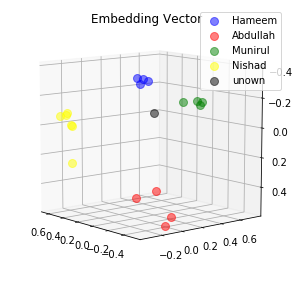

0.2216738909482956
0.23091566562652588
0.253393292427063
0.27674397826194763
Average distance is  0.24568170681595802
end distance calcul
PREDICTION :  Hameem 
 percentange :  45.1172840014022
No of Faces Detected :  1
probability :  0.9930426
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.45109326 -0.10686879 -0.22953707]]


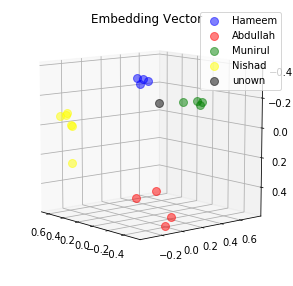

0.217864990234375
0.2466222643852234
0.2587171196937561
0.2863653302192688
Average distance is  0.2523924261331558
end distance calcul
PREDICTION :  Hameem 
 percentange :  45.31593477840203
No of Faces Detected :  1
probability :  0.9892876
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.39135742 -0.14220458 -0.25293472]]


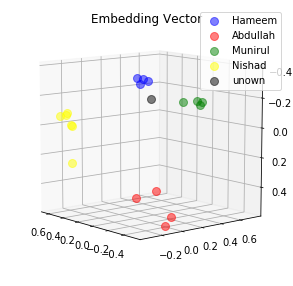

0.2011740654706955
0.22061242163181305
0.2370246946811676
0.2538309097290039
Average distance is  0.22816052287817
end distance calcul
PREDICTION :  Hameem 
 percentange :  45.82585643981696
No of Faces Detected :  1
probability :  0.8545271
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.3750267  -0.08023234 -0.27702227]]


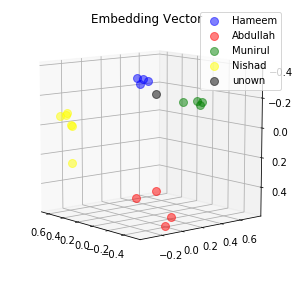

0.23804455995559692
0.2680363059043884
0.27688324451446533
0.2966530919075012
Average distance is  0.269904300570488
end distance calcul
PREDICTION :  Hameem 
 percentange :  44.607768064944096
No of Faces Detected :  1
probability :  0.9068042
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4800003  -0.230935   -0.26405913]]


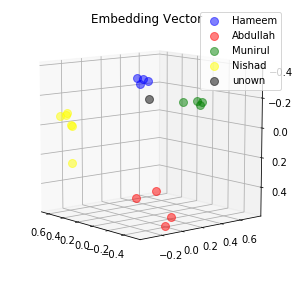

0.12065375596284866
0.1286448836326599
0.15047326683998108
0.1742737740278244
Average distance is  0.14351142011582851
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.67105038620144
No of Faces Detected :  1
probability :  0.9672215
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48430258 -0.22722584 -0.26091394]]


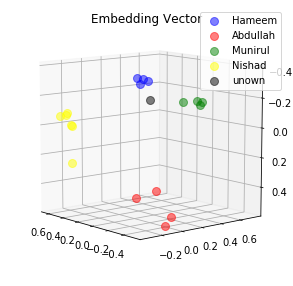

0.1240660771727562
0.13354623317718506
0.1545751392841339
0.17948105931282043
Average distance is  0.1479171272367239
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.27273466807269
No of Faces Detected :  1
probability :  0.9687884
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47349742 -0.22847553 -0.25534946]]


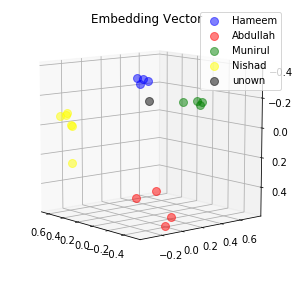

0.1305719017982483
0.13709115982055664
0.16007936000823975
0.18217501044273376
Average distance is  0.1524793580174446
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.31925852159554
No of Faces Detected :  1
probability :  0.9457343
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49725434 -0.24289025 -0.24850704]]


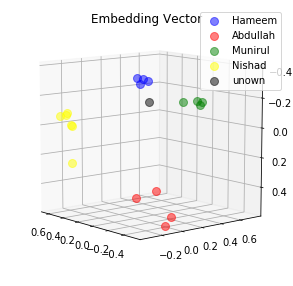

0.13302677869796753
0.13591454923152924
0.15916664898395538
0.18313074111938477
Average distance is  0.15280967950820923
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.41329342294343
No of Faces Detected :  1
probability :  0.91416574
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.42264903 -0.12546928 -0.25986743]]


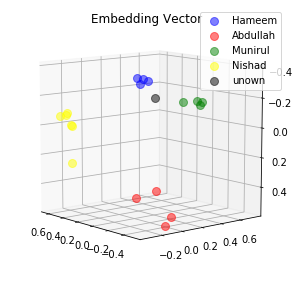

0.19317953288555145
0.22059312462806702
0.23281536996364594
0.25629860162734985
Average distance is  0.22572165727615356
end distance calcul
PREDICTION :  Hameem 
 percentange :  47.07004656234548
No of Faces Detected :  1
probability :  0.89568377
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.43692687 -0.13076526 -0.22240286]]


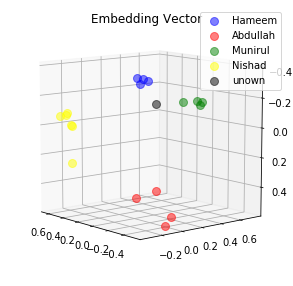

0.21101528406143188
0.23356185853481293
0.24950410425662994
0.27336516976356506
Average distance is  0.24186160415410995
end distance calcul
PREDICTION :  Hameem 
 percentange :  45.519963358922446
No of Faces Detected :  0
No of cropped_faces :  0
No of Faces Detected :  1
probability :  0.85822445
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5076294  -0.20541497 -0.24985276]]


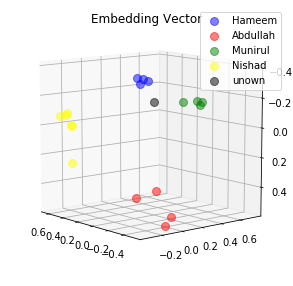

0.14126792550086975
0.15881571173667908
0.17507830262184143
0.20550592243671417
Average distance is  0.1701669655740261
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.428926103538544
No of Faces Detected :  1
probability :  0.9039855
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.52085686 -0.23218012 -0.25805765]]


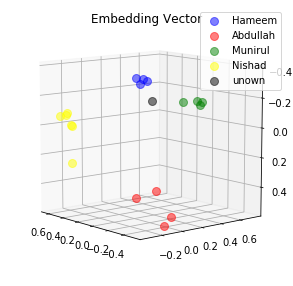

0.12770266830921173
0.13925102353096008
0.1566149890422821
0.18705037236213684
Average distance is  0.1526547633111477
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.509353479279866
No of Faces Detected :  1
probability :  0.93886375
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.51426584 -0.2227616  -0.27277964]]


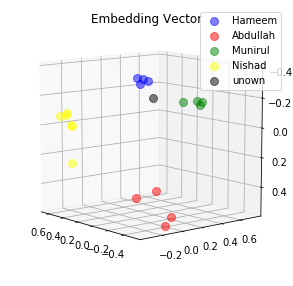

0.11482707411050797
0.13248297572135925
0.14724256098270416
0.1794768124818802
Average distance is  0.1435073558241129
end distance calcul
PREDICTION :  Hameem 
 percentange :  53.82708508597217
No of Faces Detected :  1
probability :  0.9708794
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.52133167 -0.22820306 -0.2703586 ]]


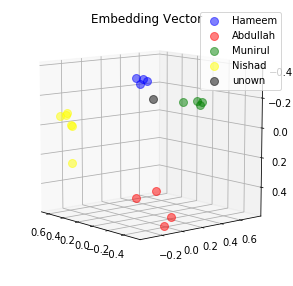

0.11695969104766846
0.13273856043815613
0.1476932317018509
0.18015722930431366
Average distance is  0.14438717812299728
end distance calcul
PREDICTION :  Hameem 
 percentange :  54.0802322870645
No of Faces Detected :  1
probability :  0.98086846
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47836286 -0.23052515 -0.27393484]]


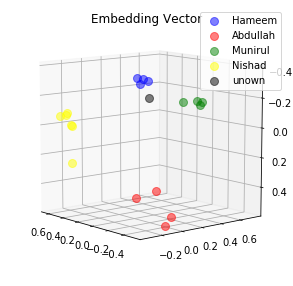

0.11147244274616241
0.12137864530086517
0.14216163754463196
0.16658492386341095
Average distance is  0.13539941236376762
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.846693322828216
No of Faces Detected :  1
probability :  0.9899918
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49508852 -0.23602201 -0.25174382]]


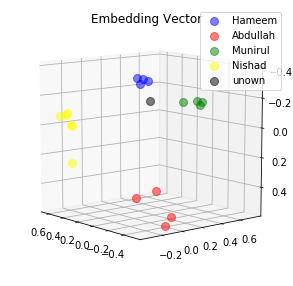

0.13073882460594177
0.13656193017959595
0.15870243310928345
0.1835797280073166
Average distance is  0.15239572897553444
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.32554934174836
No of Faces Detected :  1
probability :  0.98852766
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4791317  -0.23500715 -0.2688318 ]]


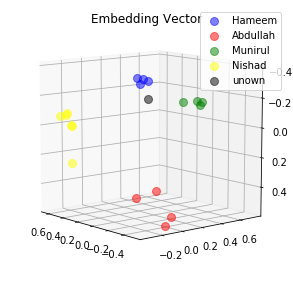

0.11531305313110352
0.12236564606428146
0.1445123851299286
0.1679578423500061
Average distance is  0.13753723166882992
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.54764070540339
No of Faces Detected :  1
probability :  0.99109995
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48890495 -0.21800917 -0.2684062 ]]


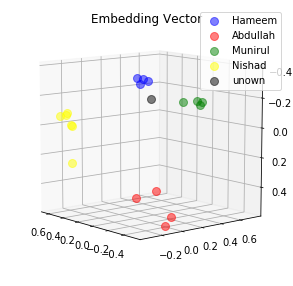

0.11918703466653824
0.13438911736011505
0.1523767113685608
0.18008197844028473
Average distance is  0.1465087104588747
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.88491957181822
No of Faces Detected :  1
probability :  0.99061
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5166634  -0.21322413 -0.26768017]]


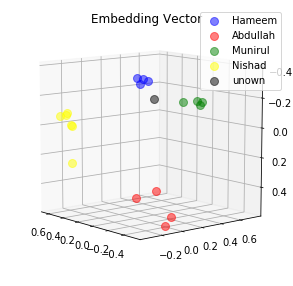

0.12310413271188736
0.14309075474739075
0.15688058733940125
0.1898566335439682
Average distance is  0.1532330270856619
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.63796786056359
No of Faces Detected :  1
probability :  0.9917737
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49873328 -0.21776573 -0.26371038]]


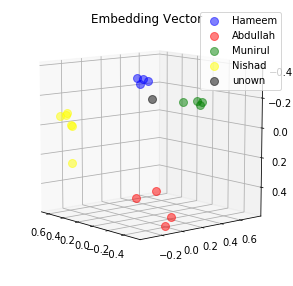

0.12354285269975662
0.1390380561351776
0.15640705823898315
0.18548662960529327
Average distance is  0.15111864916980267
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.19994258235526
No of Faces Detected :  1
probability :  0.99495685
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.49918315 -0.20925356 -0.26238534]]


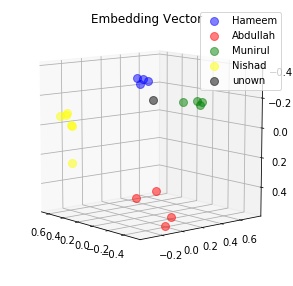

0.12775523960590363
0.14590862393379211
0.162079319357872
0.19201093912124634
Average distance is  0.15693853050470352
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.143953666917895
No of Faces Detected :  1
probability :  0.9947386
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5245127 -0.2334328 -0.2181311]]


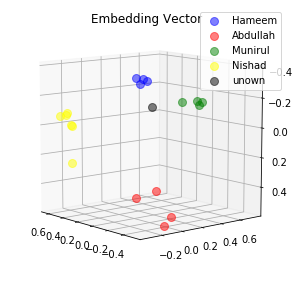

0.1668388694524765
0.17200955748558044
0.193140909075737
0.21989645063877106
Average distance is  0.18797144666314125
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.68854643142553
No of Faces Detected :  1
probability :  0.9943818
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.48890534 -0.1759305  -0.24306859]]


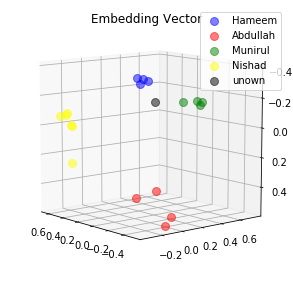

0.16002997756004333
0.18223583698272705
0.19736425578594208
0.22685444355010986
Average distance is  0.19162112846970558
end distance calcul
PREDICTION :  Hameem 
 percentange :  47.903824407895335
No of Faces Detected :  1
probability :  0.99373096
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.46990404 -0.14103329 -0.26032463]]


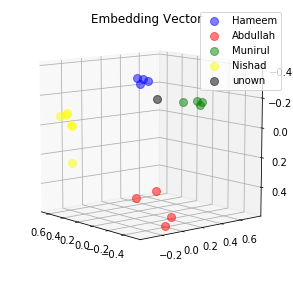

0.1693185716867447
0.1999487429857254
0.21046151220798492
0.24050500988960266
Average distance is  0.20505845919251442
end distance calcul
PREDICTION :  Hameem 
 percentange :  47.69592170113062
No of Faces Detected :  1
probability :  0.98872185
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.501375   -0.17571448 -0.24639721]]


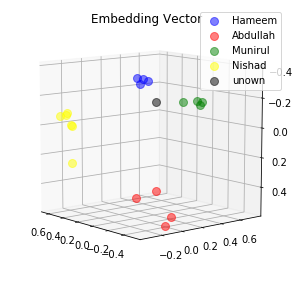

0.15723437070846558
0.18136045336723328
0.19488970935344696
0.2265220582485199
Average distance is  0.19000164791941643
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.2472580464226
No of Faces Detected :  1
probability :  0.9797441
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4882539  -0.2128669  -0.28277177]]


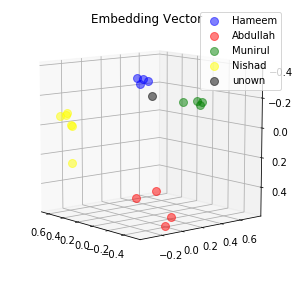

0.10780980437994003
0.12841708958148956
0.14343996345996857
0.17307499051094055
Average distance is  0.13818546198308468
end distance calcul
PREDICTION :  Hameem 
 percentange :  52.196897339749235
No of Faces Detected :  1
probability :  0.93368185
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5318587  -0.25376722 -0.19626848]]


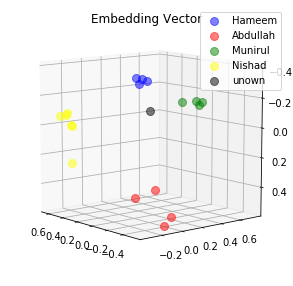

0.18800677359104156
0.18551473319530487
0.20947642624378204
0.232817143201828
Average distance is  0.20395376905798912
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.99668775320161
No of Faces Detected :  1
probability :  0.8786067
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.40908867 -0.15730596 -0.16160928]]


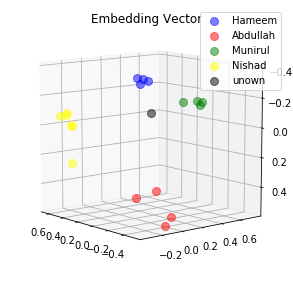

0.25597450137138367
0.26395365595817566
0.28824448585510254
0.3040389120578766
Average distance is  0.2780528888106346
end distance calcul
PREDICTION :  Hameem 
 percentange :  41.40303251409572
No of Faces Detected :  1
probability :  0.91517425
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.47689712 -0.13965705 -0.21557783]]


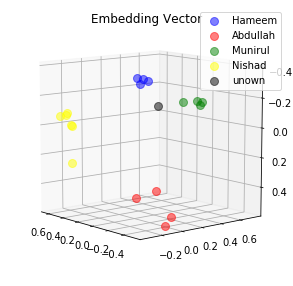

0.20360992848873138
0.2273326814174652
0.24230748414993286
0.27077552676200867
Average distance is  0.23600640520453453
end distance calcul
PREDICTION :  Hameem 
 percentange :  45.72852703233979
No of Faces Detected :  1
probability :  0.8959685
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.52473176 -0.18086228 -0.15131198]]


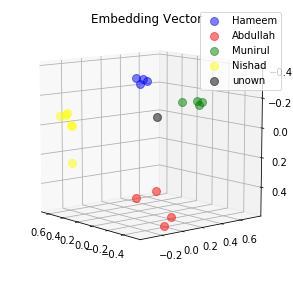

0.2435319870710373
0.2541311979293823
0.2745416760444641
0.301569402217865
Average distance is  0.2684435658156872
end distance calcul
PREDICTION :  Hameem 
 percentange :  45.001775701859295
No of Faces Detected :  1
probability :  0.92936945
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5059027  -0.21152462 -0.24305221]]


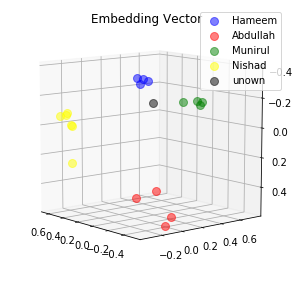

0.1454303115606308
0.1595769226551056
0.17767783999443054
0.20656327903270721
Average distance is  0.17231208831071854
end distance calcul
PREDICTION :  Hameem 
 percentange :  51.43604962021867
No of Faces Detected :  1
probability :  0.9377528
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.50133264 -0.18805312 -0.22727382]]


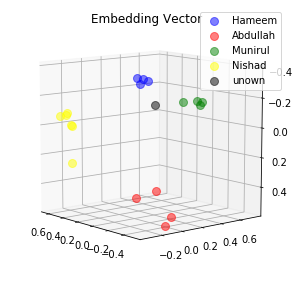

0.16842801868915558
0.18589819967746735
0.2031114250421524
0.23217114806175232
Average distance is  0.1974021978676319
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.195337602094945
No of Faces Detected :  1
probability :  0.9613273
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.45902902 -0.18960187 -0.25031593]]


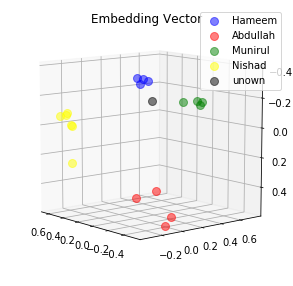

0.15144656598567963
0.16806195676326752
0.18676070868968964
0.210509791970253
Average distance is  0.17919475585222244
end distance calcul
PREDICTION :  Hameem 
 percentange :  49.08083576895636
No of Faces Detected :  1
probability :  0.963099
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4684349  -0.21294235 -0.22683845]]


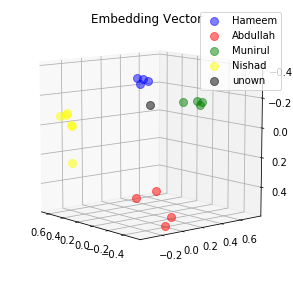

0.1624741554260254
0.16945381462574005
0.19291213154792786
0.21415600180625916
Average distance is  0.1847490258514881
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.244443292818374
No of Faces Detected :  1
probability :  0.9551599
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.4747487  -0.19355711 -0.22652066]]


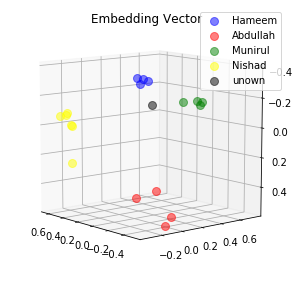

0.16817162930965424
0.1814388632774353
0.2017815113067627
0.22624202072620392
Average distance is  0.19440850615501404
end distance calcul
PREDICTION :  Hameem 
 percentange :  48.836888200660724
No of Faces Detected :  1
probability :  0.9315702
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.52063954 -0.19097482 -0.22826792]]


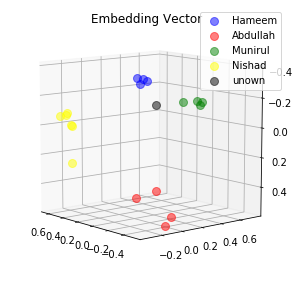

0.1680907905101776
0.18663513660430908
0.20219488441944122
0.2336939573287964
Average distance is  0.19765369221568108
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.42470065358962
No of Faces Detected :  1
probability :  0.8665659
No of cropped_faces :  1
No of embeddings :  1
start distance cal
dude its happing for Hameem [[-0.5080217  -0.16003604 -0.25240973]]


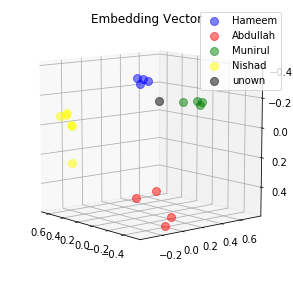

0.16143827140331268
0.19070985913276672
0.2010447382926941
0.23507092893123627
Average distance is  0.19706594944000244
end distance calcul
PREDICTION :  Hameem 
 percentange :  50.304310416706734
No of Faces Detected :  0
No of cropped_faces :  0
No of Faces Detected :  0
No of cropped_faces :  0
No of Faces Detected :  0
No of cropped_faces :  0


In [ ]:

video_file_path = '/home/knnan/Development/face_recognition/videos/ham69.mp4'
video_capture = cv2.VideoCapture(video_file_path)
frame_count = 1
while (video_capture.isOpened()):


    start = timer()
    ret, frame = video_capture.read()
    if (ret != True):
        break
    original_image = frame.copy()
    all_faces_array,all_cordinates,original_image = getFaces(original_image,'video')
    if (len(all_faces_array) < 1):
        continue
    all_face_embeddings = get_multi_embeddings(model,all_faces_array)

    for single_face_embedding,single_cordinate in zip(all_face_embeddings,all_cordinates):
        left,top,right,bottom = single_cordinate
        samples = expand_dims(single_face_embedding, axis=0)
        yhat_class = svcmodel.predict(samples)
        yhat_prob = svcmodel.predict_proba(samples)


        class_index = yhat_class[0]
        class_probability = yhat_prob[0,class_index] * 100
        predict_names = out_encoder.inverse_transform(yhat_class)
        guessed_name = predict_names[0]
        print("start distance cal")
        update_plot(guessed_name,single_face_embedding)
#         input("hello is this fine")
        mind = calman(guessed_name,single_face_embedding)
        if(mind[0] > 0.23 and mind[1] > 0.34):
            guessed_name='unkown'
        print("end distance calcul")
        print("PREDICTION : ",guessed_name,"\n percentange : ",class_probability)
        cv2.rectangle(original_image, (left, top), (right, bottom), (0, 0, 255), 2)
        # Draw a label with a name below the face
        cv2.rectangle(original_image, (left, bottom - 35), (right, bottom), (0, 0, 255), cv2.FILLED)
        font = cv2.FONT_HERSHEY_DUPLEX

        cv2.putText(original_image, guessed_name + '_' + str(class_probability), (left + 6, bottom - 6), font, 1.0, (255, 255, 255), 1)
#         input("go for the next image")
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    original_image = cv2.resize(original_image,(800,800))

    cv2.imshow('Video', original_image)
    frame_count = frame_count + 1
#     input("Press Enter to continue...")
#     cv2.waitKey(0)

    
video_capture.release()
cv2.destroyAllWindows()

In [ ]:
print('hello')

for i in range(10):
    val = float(input('ente a val'))
    update_plot('Abdullah',[ val, -0.04808804,  0.00033398,  0.05448524, -0.00814302,
            0.0993342 , -0.05742149, -0.12658252,  0.05800844,  0.06518998,
           -0.14255662, -0.04762699, -0.03086714, -0.05159939,  0.06878399,
            0.00372778,  0.1066353 ,  0.08166286,  0.02999253, -0.07199243,
            0.10032801, -0.06043714,  0.10162897,  0.01797566, -0.03175441,
            0.12261476, -0.1103695 ,  0.01715428, -0.04463387,  0.09914241,
            0.06179135, -0.01382082, -0.21110173,  0.15370001,  0.21007901,
           -0.05744436, -0.05989505, -0.06401564,  0.14590797,  0.07693643,
           -0.14381012, -0.0171214 ,  0.2248294 , -0.13745569,  0.11061407,
            0.10729294,  0.02931175,  0.06519355, -0.09800217,  0.04060139,
            0.0562949 , -0.251426  , -0.11272599,  0.08550988,  0.08935807,
           -0.13188356,  0.05975243, -0.06127455,  0.04928077, -0.14526674,
           -0.06827503, -0.04819015,  0.16005623, -0.030079  , -0.12459343,
           -0.01120914, -0.15685287, -0.054521  , -0.10594378, -0.02165919,
            0.14953347, -0.12367372,  0.15332851,  0.03502781,  0.05130915,
            0.065934  ,  0.02917516,  0.05483032,  0.04992333, -0.03827957,
            0.00996417, -0.08074603, -0.09407441, -0.01773363, -0.03599301,
           -0.09406547,  0.06721407, -0.05079089, -0.03767489,  0.01986375,
            0.07329273,  0.06478743, -0.0826028 , -0.02903376,  0.01359174,
            0.05349535,  0.01797061,  0.11603426, -0.14324905, -0.0532944 ,
            0.03504115, -0.0545271 , -0.00585031, -0.01145274, -0.0255636 ,
           -0.0738595 , -0.11117644, -0.02360104, -0.04186777, -0.0622473 ,
            0.13666499, -0.11143064, -0.0349316 , -0.0480657 ,  0.07222692,
           -0.04087982,  0.00130105,  0.05697052,  0.01839633, -0.0659586 ,
           -0.07645479, -0.08626156,  0.14685333, -0.01553046, -0.07409596,
           -0.02617995,  0.02110379, -0.12973012])